In [2]:
import sys
import gc

import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow.keras.backend as K

print(tf.config.list_physical_devices('GPU'))

sys.path.append('../')
import DCTR

from energyflow.utils import to_categorical
from sklearn.model_selection import train_test_split



[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
from importlib import reload
reload(DCTR)


# load data

In [3]:
# directory with pre converted lhe files as numpy arrays
data_dir = '../../Data' # modify as needed


In [4]:
# Load POWHEG hvq x0 datasets
# x0_nrm for training, x0_plt and x0_plt_nrm for calculating stats used to decide which model performs best
# only contain tt-pair; every event has order: 
    # tt-pair, top, anti-top
# every particle has arguments: 
    # [pt, y, phi, mass, eta, E, PID, w, theta]
    # [0 , 1, 2  , 3   , 4  , 5, 6  , 7, 8    ]

# POWHEG hvq
x0_nrm = []
x0_nrm = np.load(f'{data_dir}/POWHEG_hvq/showered/normed_lhe_01.npy')[:9543943] # 9543943 num of NNLO samples
print(f'POWHEG hvq x0_nrm.shape:     {x0_nrm.shape}')

# plotting data; different from training data; for calculating stats
x0_plt = []
x0_plt = np.load(f'{data_dir}/POWHEG_hvq/showered/converted_lhe_02.npy')[:9543943]
print(f'POWHEG hvq x0_plt.shape:     {x0_plt.shape}')

x0_plt_nrm = []
x0_plt_nrm = np.load(f'{data_dir}/POWHEG_hvq/showered/normed_lhe_02.npy')[:9543943]
print(f'POWHEG hvq x0_plt_nrm.shape: {x0_plt_nrm.shape}')



POWHEG hvq x0_nrm.shape:     (9543943, 3, 9)
POWHEG hvq x0_plt.shape:     (9543943, 3, 9)
POWHEG hvq x0_plt_nrm.shape: (9543943, 3, 9)


In [5]:
# MiNNLO x1
# training data
x1_nrm = []
x1_nrm = np.load(f'{data_dir}/MiNNLO/showered/normed_lhe.npy')
print(f'MiNNLO all particles x1_nrm.shape: {x1_nrm.shape}')

# plotting data, same as above (due to lack of statistics) but unnormalized
x1_plt = []
x1_plt = np.load(f'{data_dir}/MiNNLO/showered/converted_lhe.npy')
print(f'MiNNLO all particles x1_plt.shape: {x1_plt.shape}')


MiNNLO all particles x1_nrm.shape: (9543943, 3, 9)
MiNNLO all particles x1_plt.shape: (9543943, 3, 9)


In [6]:
# get event generator weights

x0_plt_wgt = x0_plt[:, 0, 7].copy() 

x1_plt_wgt = x1_plt[:, 0, 7].copy()


### prep data

In [7]:
# delete eta (pseudorapidity) and Energy -> Train only with [pt, y, phi, m, PID]

# delete energy
x0_nrm = np.delete(x0_nrm, 5, -1)
x0_plt_nrm = np.delete(x0_plt_nrm, 5, -1)
x1_nrm = np.delete(x1_nrm, 5, -1)

# delete eta
x0_nrm = np.delete(x0_nrm, 4, -1)
x0_plt_nrm = np.delete(x0_plt_nrm, 4, -1)
x1_nrm = np.delete(x1_nrm, 4, -1)


In [8]:
K.clear_session() 
print(gc.collect()) # cpu gabage collection to free up memory from discarded temp arrays


55


# Neural Positive Reweighter

### reweighting NNLO with pos and neg wgt to all pos wgts


In [ ]:
''' TRAINING CODE

runs = 5
losses = ['mse', 'cce']
batch_sizes = [4, 8, 16, 32] # mulipliers of 8192
wgts = ['org', 'np_mse', 'np_cce']

combinations = list(itertools.product(losses, batch_sizes, wgts))

loss, batch_mult, wgt_label = combinations[process_id - 1]
batch_size = batch_mult*8192
if wgt_label == 'org':
    wgt_train = wgt_train_org
    wgt_val = wgt_val_org
elif wgt_label == 'np_mse':
    wgt_train = wgt_train_mse
    wgt_val = wgt_val_mse
else:
    wgt_train = wgt_train_cce
    wgt_val = wgt_val_cce

# set up NN and CallBacks
# defaults:
''''''
input_dim=5, Phi_sizes = (100,100,128), F_sizes = (100,100,100),
loss = 'cce', dropout=0.0, l2_reg=0.0, Phi_acts='relu', F_acts='relu', output_act='softmax',
learning_rate=0.001, patience=10, use_scheduler=True, monitor='val_loss', reduceLR = True,
mode='min', savePath=currentPath, saveLabel='DCTR_training', summary=False, verbose = 2
''''''

for run in range(1, runs+1):
    dctr_nn, cb = DCTR.setup_nn(
        patience=15,
        loss = loss,
        use_scheduler=False,
        reduceLR=True,
        saveLabel=f'DCTR_NNLO_wgt_{wgt_label}_loss_{loss}_{run}_batchsize_{batch_size}',
        savePath='./saved_models/',
        summary=False
    )
    
    # train NN
    ''''''
    neecessary args:
    dctr, callbacks, X_train, Y_train, X_val, Y_val, 
    
    default args:
    wgt_train=1.0, wgt_val=1.0, epochs=80, batch_size=8192, savePath=currentPath, saveLabel='DCTR_training', verbose = 2, plot=True):
    ''''''
    
    DCTR.train(
        dctr_nn,
        cb,
        x_train,
        y_train,
        x_val,
        y_val,
        wgt_train,
        wgt_val,
        batch_size=batch_size,
        epochs=100,
        saveLabel=f'DCTR_NNLO_wgt_{wgt_label}_loss_{loss}_{run}_batchsize_{batch_size}',
        savePath='./saved_models/',
    )

'''

In [9]:
# data info
save_path='./saved_models/'

runs = 5
losses = ['mse', 'cce']
batch_sizes = [4, 8, 16, 32] # mulipliers of 8192
wgts = ['org', 'np_mse', 'np_cce']


In [31]:
# calculate rwgt from trained models
# rwgt from X1 with uniform wgts to X1 with pos/neg wgts
    
for loss in losses:
    for batch_mult in batch_sizes:
        batch_size = batch_mult*8192
        for wgt in wgts:
            for run in range(1, runs+1):
                print(f'starting with run {run} from {batch_mult = } with {loss} loss and wgts {wgt}')
                # clear previous from mem
                rwgt = []
                predicts = []
                K.clear_session()
                gc.collect()
                
                # identifying string
                save_label = f'DCTR_NNLO_wgt_{wgt}_loss_{loss}_{run}_batchsize_{batch_size}'
    
                # load weights
                dctr = tf.keras.models.load_model(f'{save_path}{save_label}.tf')
    
                # predict weights
                predicts = dctr.predict(x0_plt_nrm[...,:-2], batch_size=batch_size) # last two are wgt and theta classifier
    
                rwgt = np.divide(predicts[:,1], (1-predicts[:,1]), out=np.zeros_like(predicts[:,1]), where=(predicts[:,1])!=1.0 )
                rwgt = np.array(rwgt)
                print(f'mean rwgt: {np.mean(rwgt):.4f}')
                np.save(f'{save_path}{save_label}_X0_rwgt.npy', rwgt)


starting with run 1 from batch_mult = 4 with mse loss and wgts org
mean rwgt: 0.8133
starting with run 2 from batch_mult = 4 with mse loss and wgts org
mean rwgt: 0.8077
starting with run 3 from batch_mult = 4 with mse loss and wgts org
mean rwgt: 0.8203
starting with run 4 from batch_mult = 4 with mse loss and wgts org
mean rwgt: 0.8127
starting with run 5 from batch_mult = 4 with mse loss and wgts org
mean rwgt: 0.8066
starting with run 1 from batch_mult = 4 with mse loss and wgts np_mse
mean rwgt: 0.8126
starting with run 2 from batch_mult = 4 with mse loss and wgts np_mse
mean rwgt: 0.8005
starting with run 3 from batch_mult = 4 with mse loss and wgts np_mse
mean rwgt: 0.8148
starting with run 4 from batch_mult = 4 with mse loss and wgts np_mse
mean rwgt: 0.8081
starting with run 5 from batch_mult = 4 with mse loss and wgts np_mse
mean rwgt: 0.8126
starting with run 1 from batch_mult = 4 with mse loss and wgts np_cce
mean rwgt: 0.8119
starting with run 2 from batch_mult = 4 with ms

In [62]:
# load wgts from disk and calc histograms for pT, eta and delta_phi
# compare batch sizes and loss functions

# binning for hists
div = 22 # all hists should have same num bins, to avoid nested arrays
pt_bins  = np.logspace(np.log10(30), np.log10(1000), div)
eta_bins = np.linspace(-6, 6, div)
phi_bins = np.linspace(0, np.pi, div)

batch_hists = []
pt_hist = []
eta_hist = []
phi_hist = []
rwgt = []

# calculate delta phi
x0_delta_phi = DCTR.delta_phi(x0_plt)

for loss in losses:
    for batch_mult in batch_sizes:
        batch_size = batch_mult*8192
        for wgt in wgts:
            batch_hists = []
            for run in range(1, runs+1):
                print(f'starting with {run = } with {wgt = } from {batch_mult = } with {loss = }')
                save_label = f'DCTR_NNLO_wgt_{wgt}_loss_{loss}_{run}_batchsize_{batch_size}'
                rwgt = np.load(f'{save_path}{save_label}_X0_rwgt.npy')
                # every particle has arguments: 
                # [pt, y, phi, mass, eta, E, PID, w, theta]
                # [0 , 1, 2  , 3   , 4  , 5, 6  , 7, 8    ]
                
                pt_hist  = np.histogram(x0_plt[:,0,0], weights = rwgt, density=True, bins=pt_bins)[0]
                eta_hist = np.histogram(x0_plt[:,0,4], weights = rwgt, density=True, bins=eta_bins)[0]
                phi_hist = np.histogram(x0_delta_phi,  weights = rwgt, density=True, bins=phi_bins)[0]
    
                batch_hists.append(
                    [pt_hist.copy(), eta_hist.copy(), phi_hist.copy()]
                )
    
            # get mean for each hist bin across runs
            pt_hist_mean  = np.mean(np.array(batch_hists)[:, 0, :], axis=0)
            eta_hist_mean = np.mean(np.array(batch_hists)[:, 1, :], axis=0)
            phi_hist_mean = np.mean(np.array(batch_hists)[:, 2, :], axis=0)
            
            # append mean hists to list of hists of that batch size
            batch_hists.append(
                [pt_hist_mean.copy(), eta_hist_mean.copy(), phi_hist_mean.copy()]
            )
    
            # get std of hists
            pt_hist_std  = np.std(np.array(batch_hists)[:, 0, :], axis=0)
            eta_hist_std = np.std(np.array(batch_hists)[:, 1, :], axis=0)
            phi_hist_std = np.std(np.array(batch_hists)[:, 2, :], axis=0)
            
            # append std hists to list of hists of that batch size
            batch_hists.append(
                [pt_hist_std.copy(), eta_hist_std.copy(), phi_hist_std.copy()]
            )
            
            batch_hists = np.array(batch_hists)
            label = f'DCTR_NNLO_wgt_{wgt}_loss_{loss}_batchsize_{batch_size}_hists'
            np.save(f'{save_path}{label}.npy', batch_hists)


starting with run = 1 with wgt = 'org' from batch_mult = 4 with loss = 'mse'
starting with run = 2 with wgt = 'org' from batch_mult = 4 with loss = 'mse'
starting with run = 3 with wgt = 'org' from batch_mult = 4 with loss = 'mse'
starting with run = 4 with wgt = 'org' from batch_mult = 4 with loss = 'mse'
starting with run = 5 with wgt = 'org' from batch_mult = 4 with loss = 'mse'
starting with run = 1 with wgt = 'np_mse' from batch_mult = 4 with loss = 'mse'
starting with run = 2 with wgt = 'np_mse' from batch_mult = 4 with loss = 'mse'
starting with run = 3 with wgt = 'np_mse' from batch_mult = 4 with loss = 'mse'
starting with run = 4 with wgt = 'np_mse' from batch_mult = 4 with loss = 'mse'
starting with run = 5 with wgt = 'np_mse' from batch_mult = 4 with loss = 'mse'
starting with run = 1 with wgt = 'np_cce' from batch_mult = 4 with loss = 'mse'
starting with run = 2 with wgt = 'np_cce' from batch_mult = 4 with loss = 'mse'
starting with run = 3 with wgt = 'np_cce' from batch_mu

In [64]:
x0_pt_hist  = np.histogram(x0_plt[:,0,0], weights = x0_plt_wgt, density=True, bins=pt_bins)[0]
x0_eta_hist = np.histogram(x0_plt[:,0,4], weights = x0_plt_wgt, density=True, bins=eta_bins)[0]
x0_phi_hist = np.histogram(x0_delta_phi,  weights = x0_plt_wgt, density=True, bins=phi_bins)[0]

x1_delta_phi = DCTR.delta_phi(x1_plt)
x1_pt_hist  = np.histogram(x1_plt[:,0,0], weights = x1_plt_wgt, density=True, bins=pt_bins)[0]
x1_eta_hist = np.histogram(x1_plt[:,0,4], weights = x1_plt_wgt, density=True, bins=eta_bins)[0]
x1_phi_hist = np.histogram(x1_delta_phi,  weights = x1_plt_wgt, density=True, bins=phi_bins)[0]


In [39]:
def reduced_chi2_test(hist, target_hist, bins, N):
    bin_widths = []
    for i, _ in enumerate(bins[:-1]):
        width = bins[i+1] - bins[i]
        bin_widths.append(width)
    prob = np.multiply(hist, bin_widths)
    target_prob = np.multiply(target_hist, bin_widths)

    chi2 = np.sum(
            N*np.divide(
                np.power(prob - target_prob, 2),
                target_prob
            )
        )
    reduced_chi2 = chi2/len(bins[:-1])

    return reduced_chi2


starting with wgt = 'org' batch_mult = 4 and loss = 'mse'
(7, 3, 21)


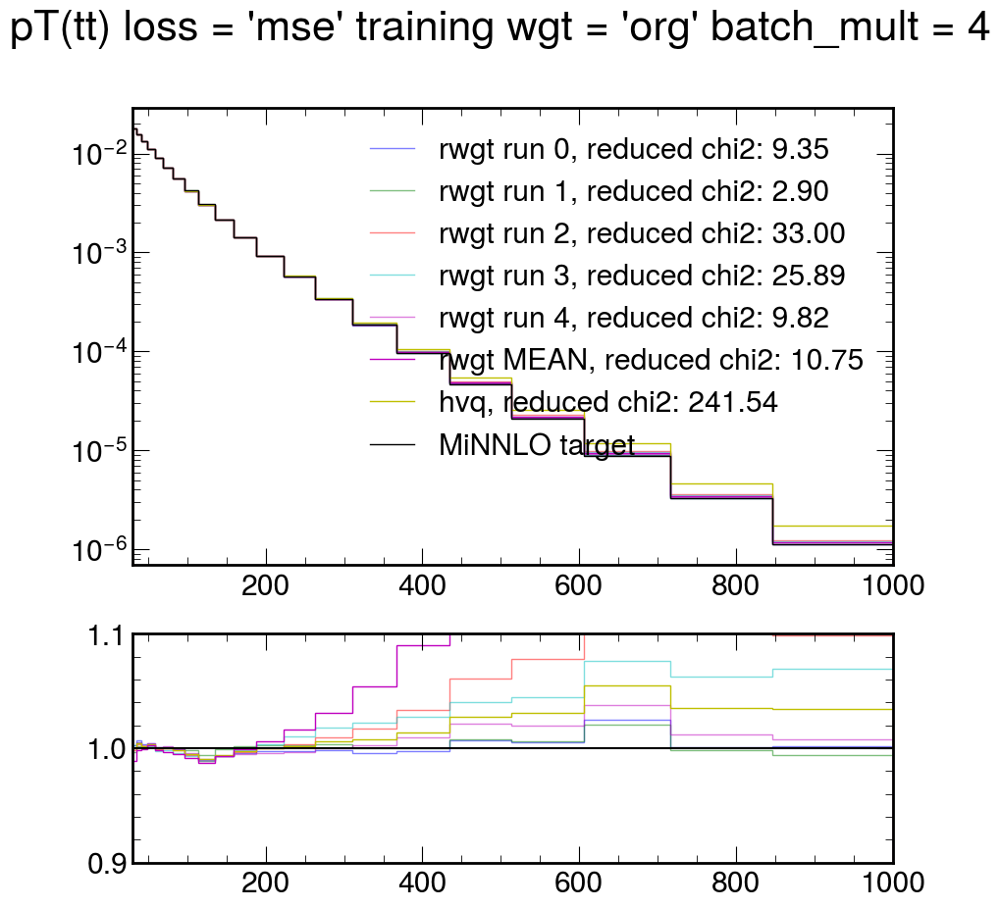

starting with wgt = 'np_mse' batch_mult = 4 and loss = 'mse'
(7, 3, 21)


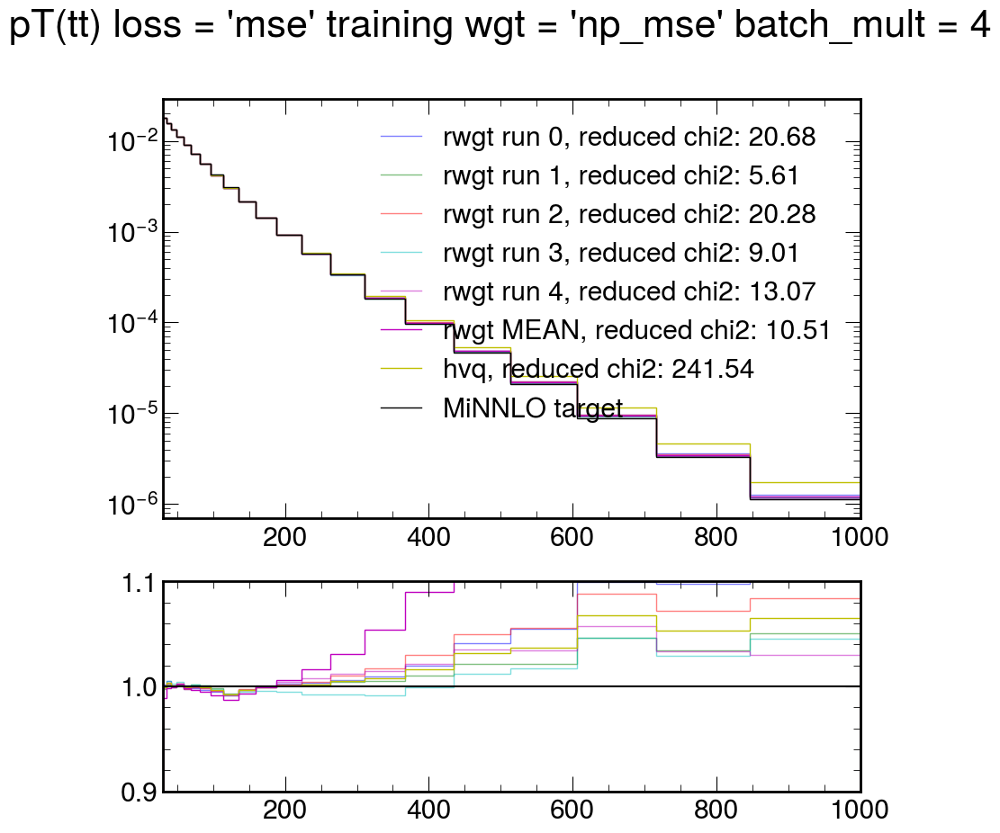

starting with wgt = 'np_cce' batch_mult = 4 and loss = 'mse'
(7, 3, 21)


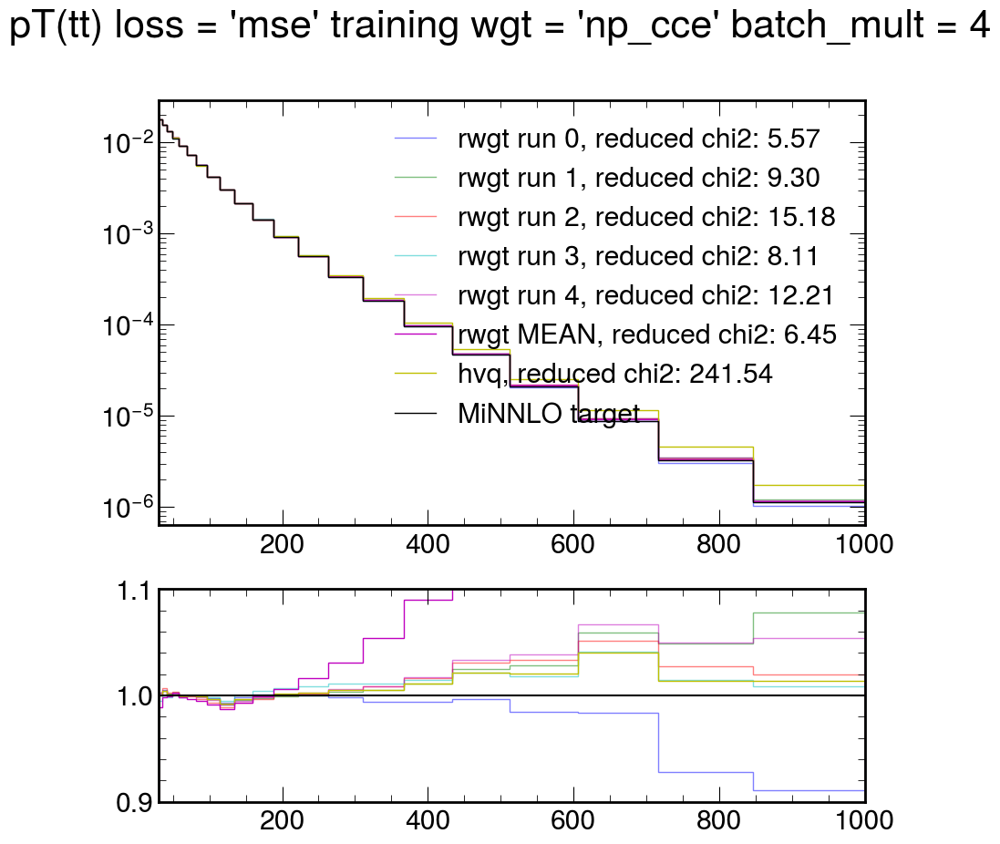

starting with wgt = 'org' batch_mult = 8 and loss = 'mse'
(7, 3, 21)


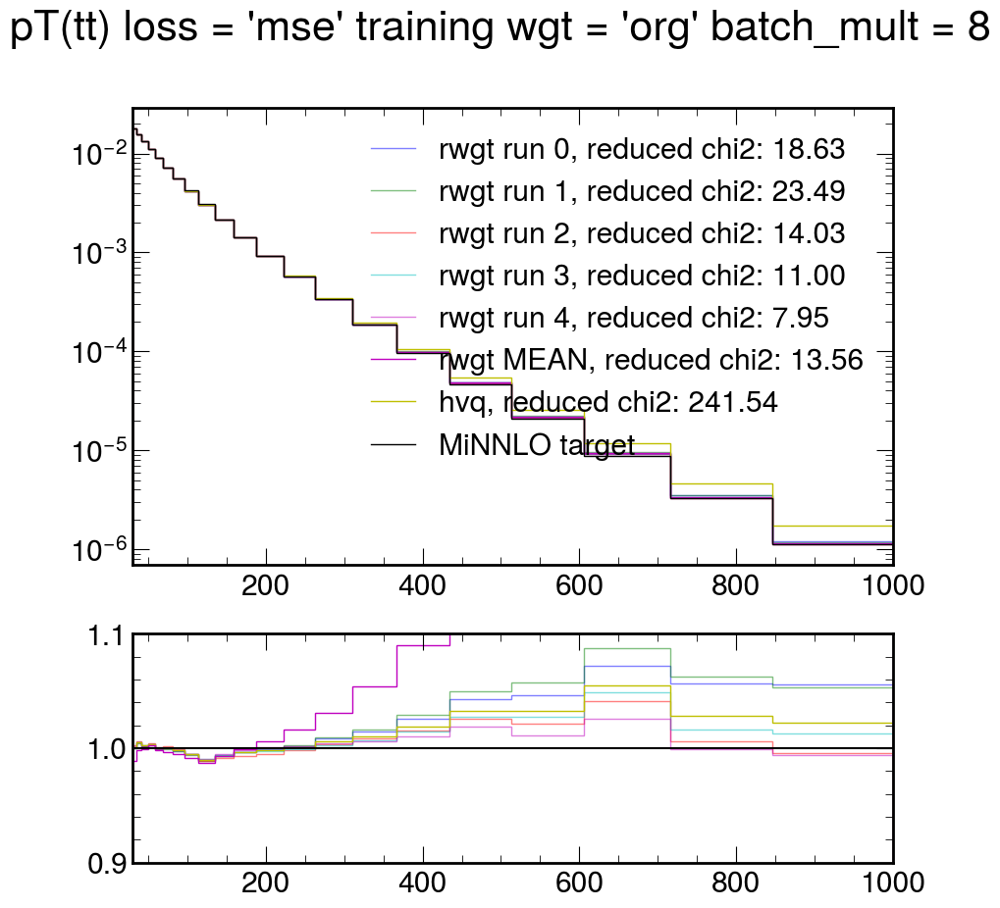

starting with wgt = 'np_mse' batch_mult = 8 and loss = 'mse'
(7, 3, 21)


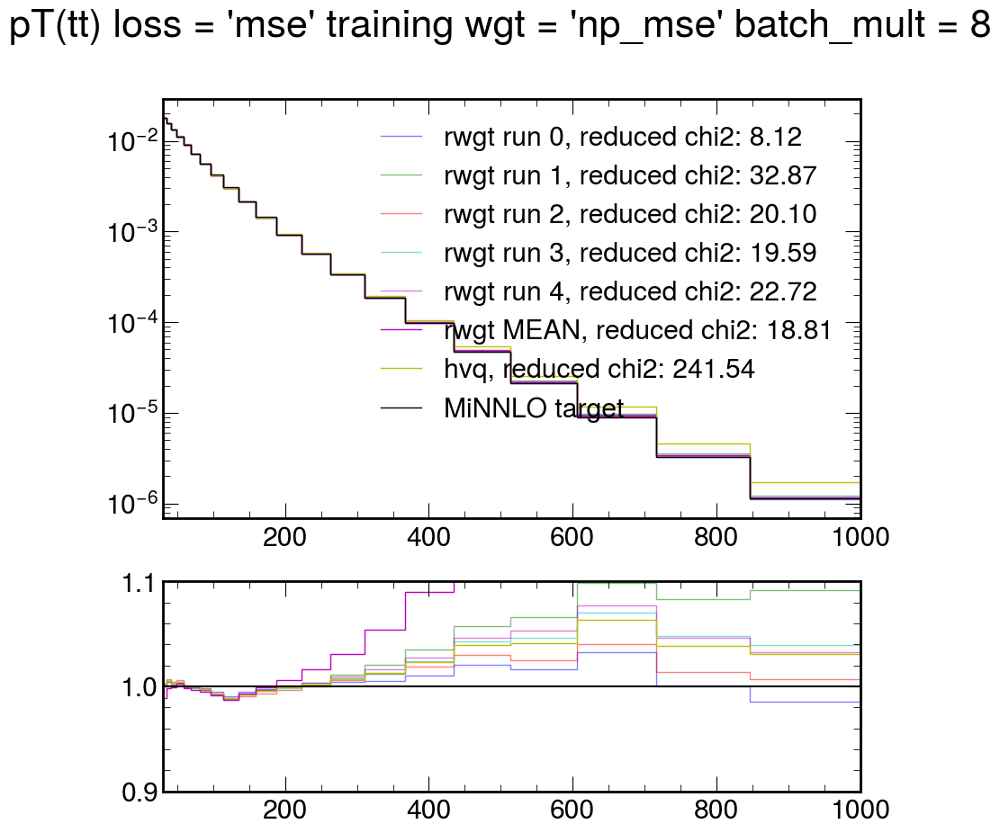

starting with wgt = 'np_cce' batch_mult = 8 and loss = 'mse'
(7, 3, 21)


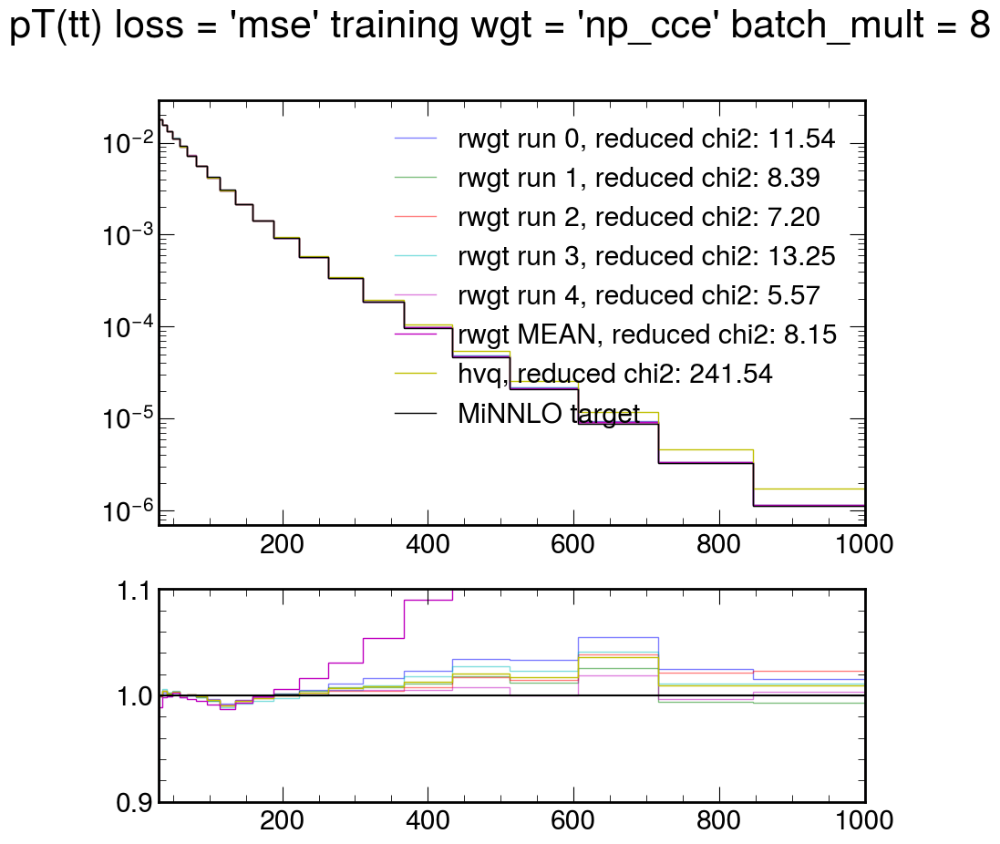

starting with wgt = 'org' batch_mult = 16 and loss = 'mse'
(7, 3, 21)


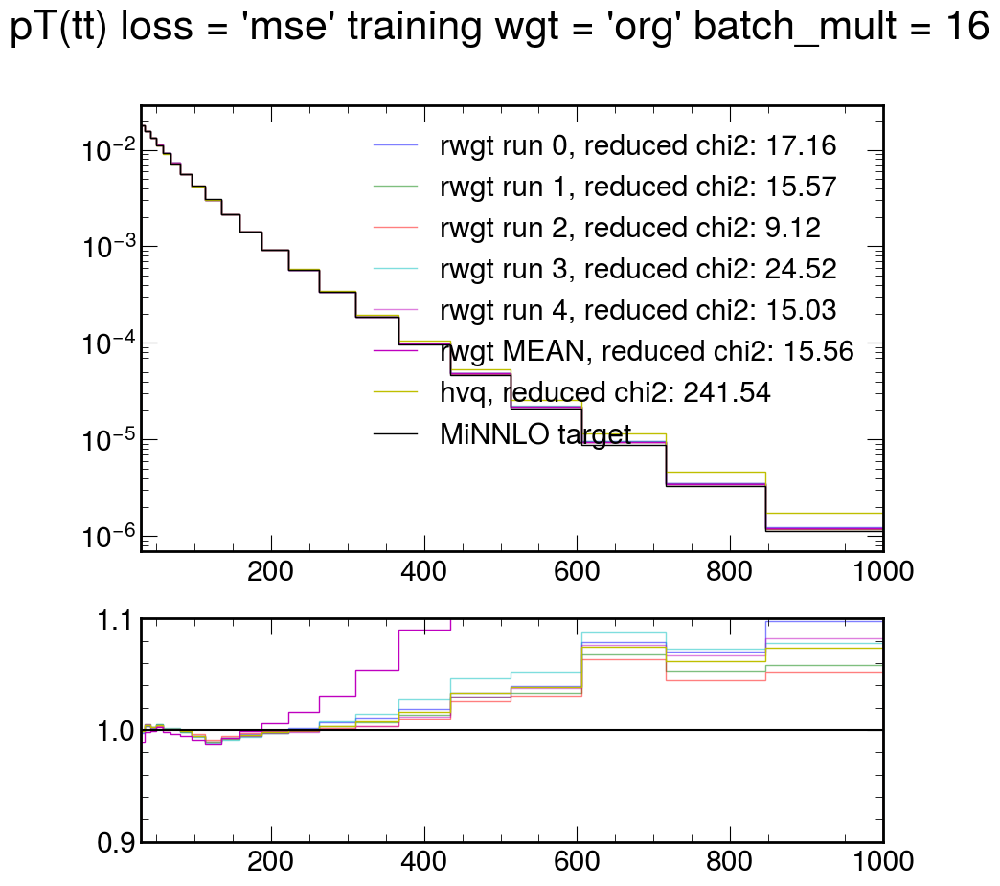

starting with wgt = 'np_mse' batch_mult = 16 and loss = 'mse'
(7, 3, 21)


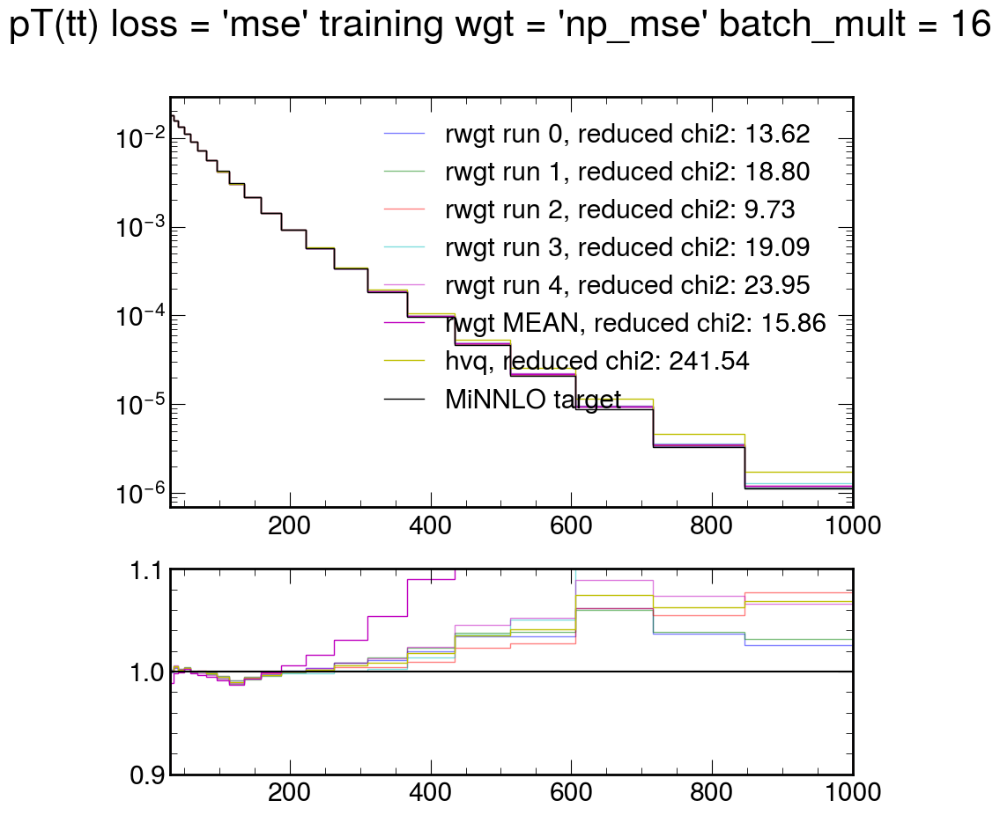

starting with wgt = 'np_cce' batch_mult = 16 and loss = 'mse'
(7, 3, 21)


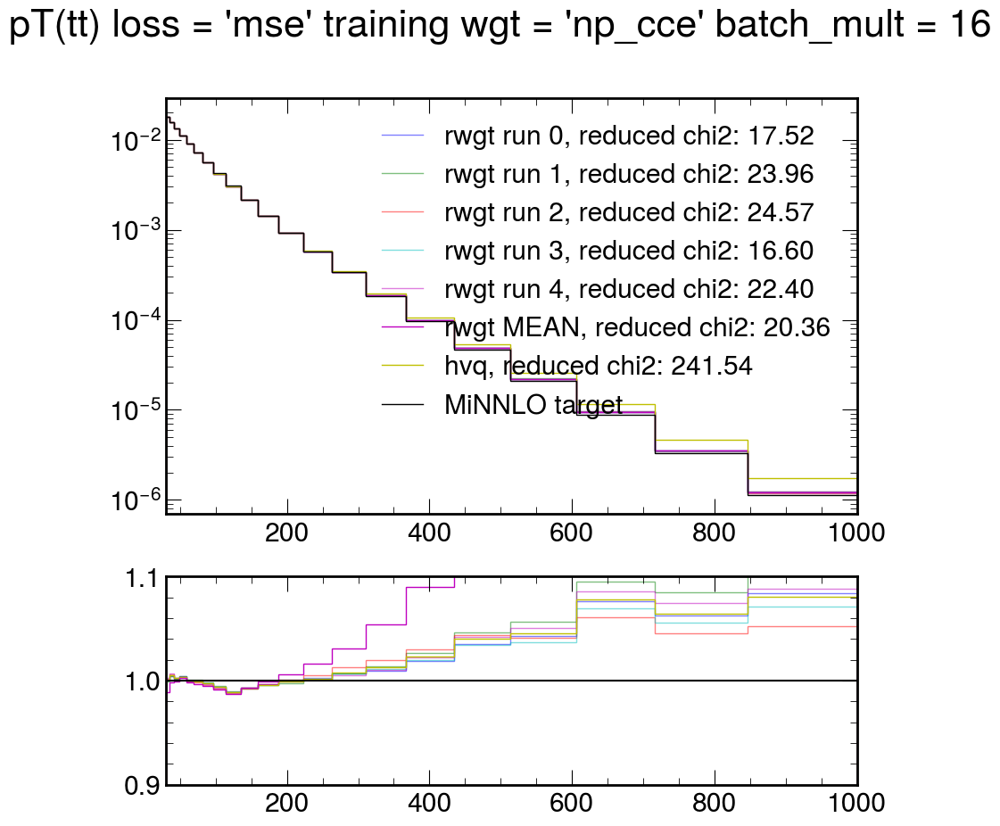

starting with wgt = 'org' batch_mult = 32 and loss = 'mse'
(7, 3, 21)


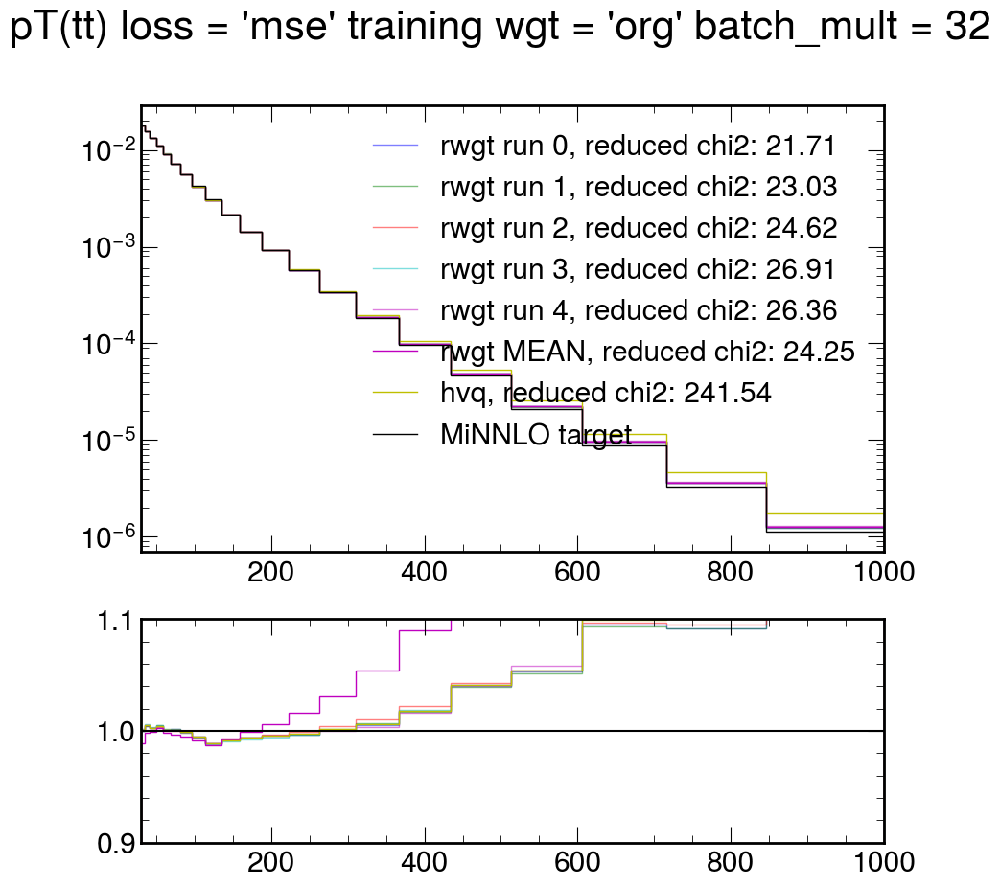

starting with wgt = 'np_mse' batch_mult = 32 and loss = 'mse'
(7, 3, 21)


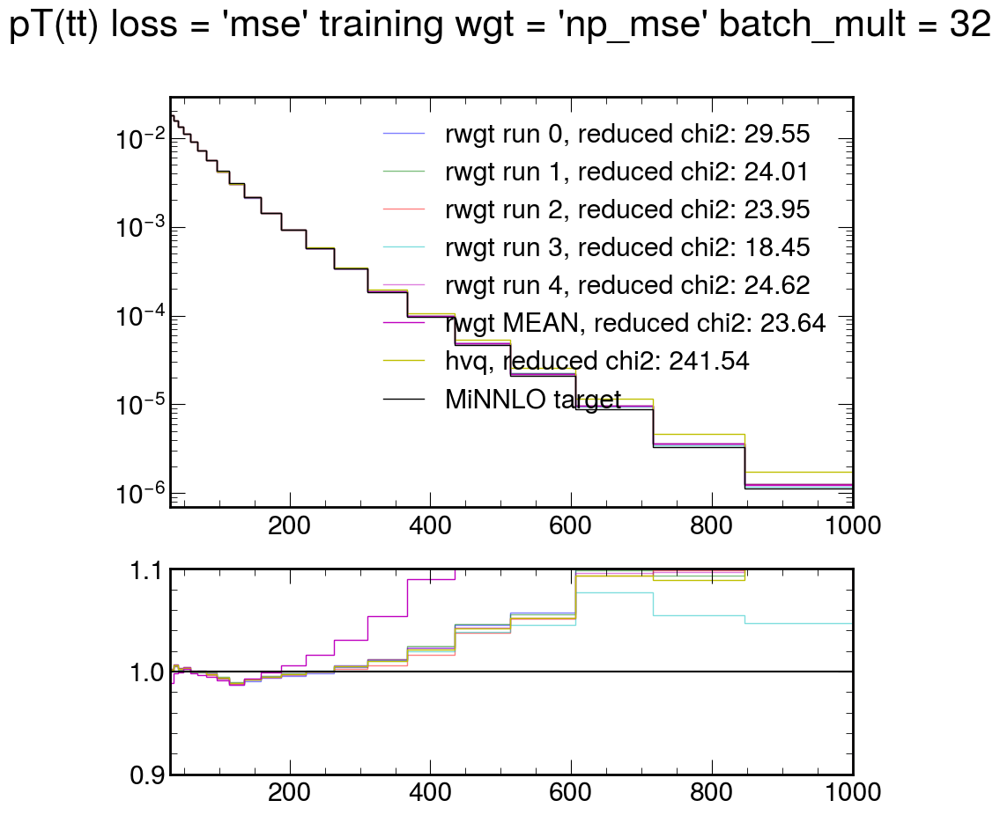

starting with wgt = 'np_cce' batch_mult = 32 and loss = 'mse'
(7, 3, 21)


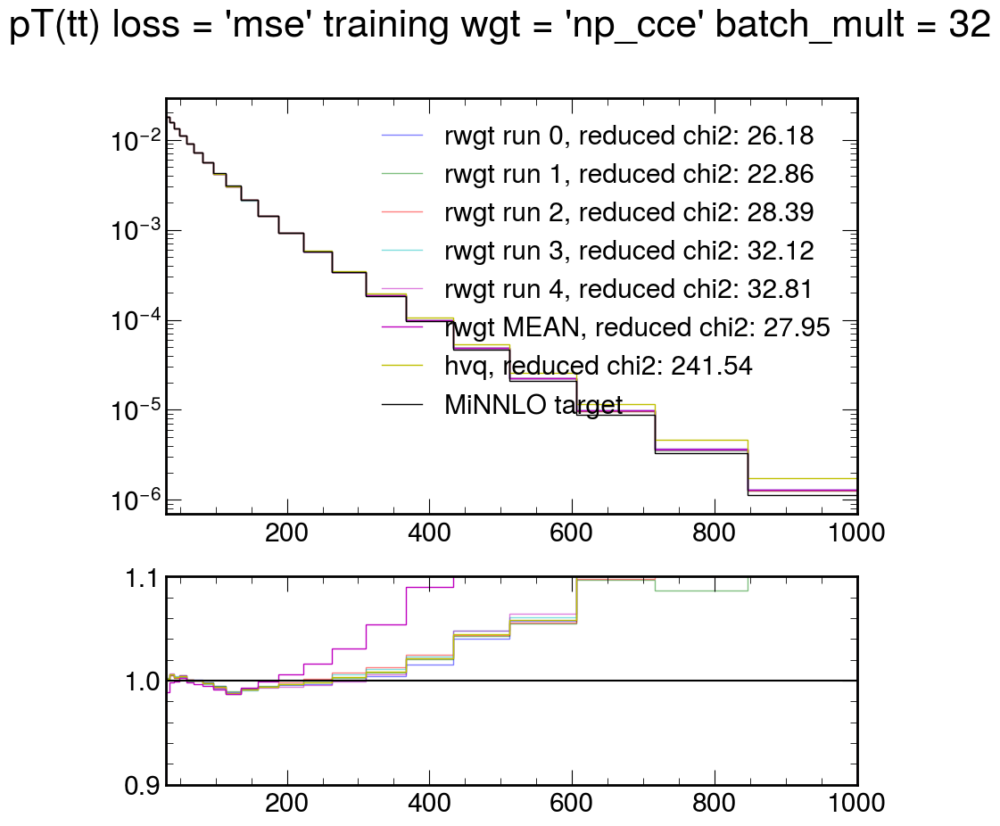

starting with wgt = 'org' batch_mult = 4 and loss = 'cce'
(7, 3, 21)


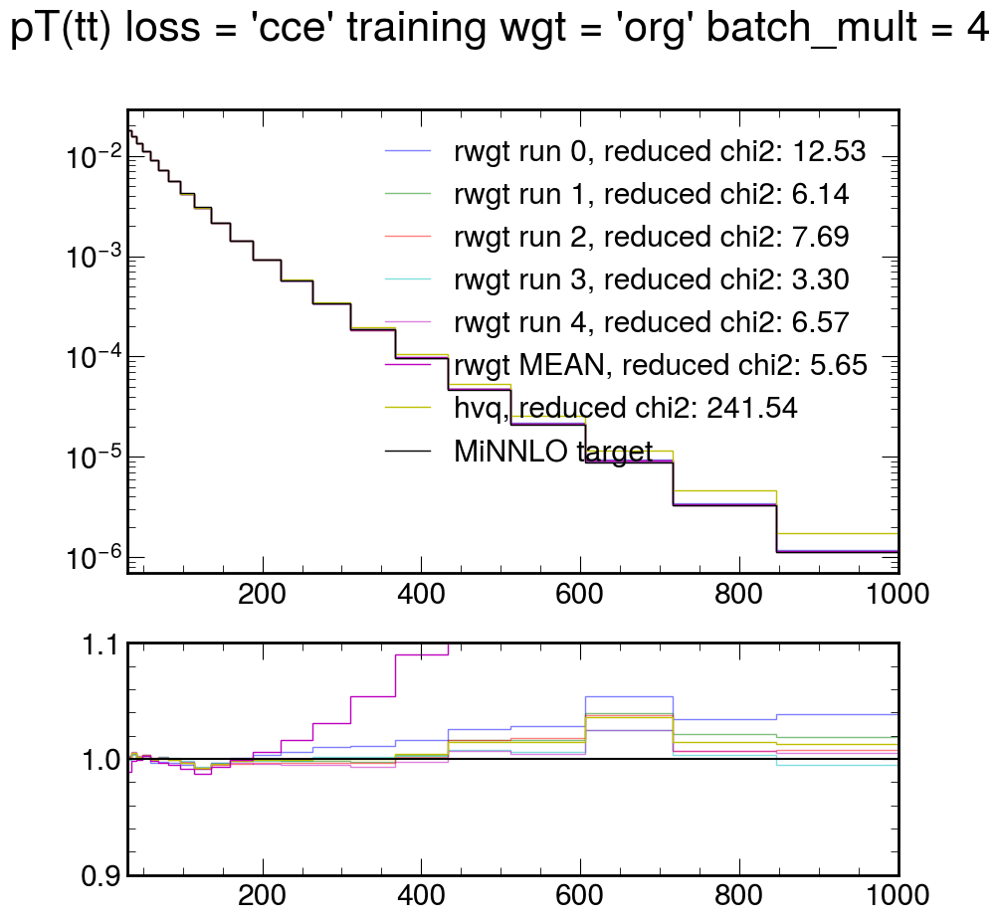

starting with wgt = 'np_mse' batch_mult = 4 and loss = 'cce'
(7, 3, 21)


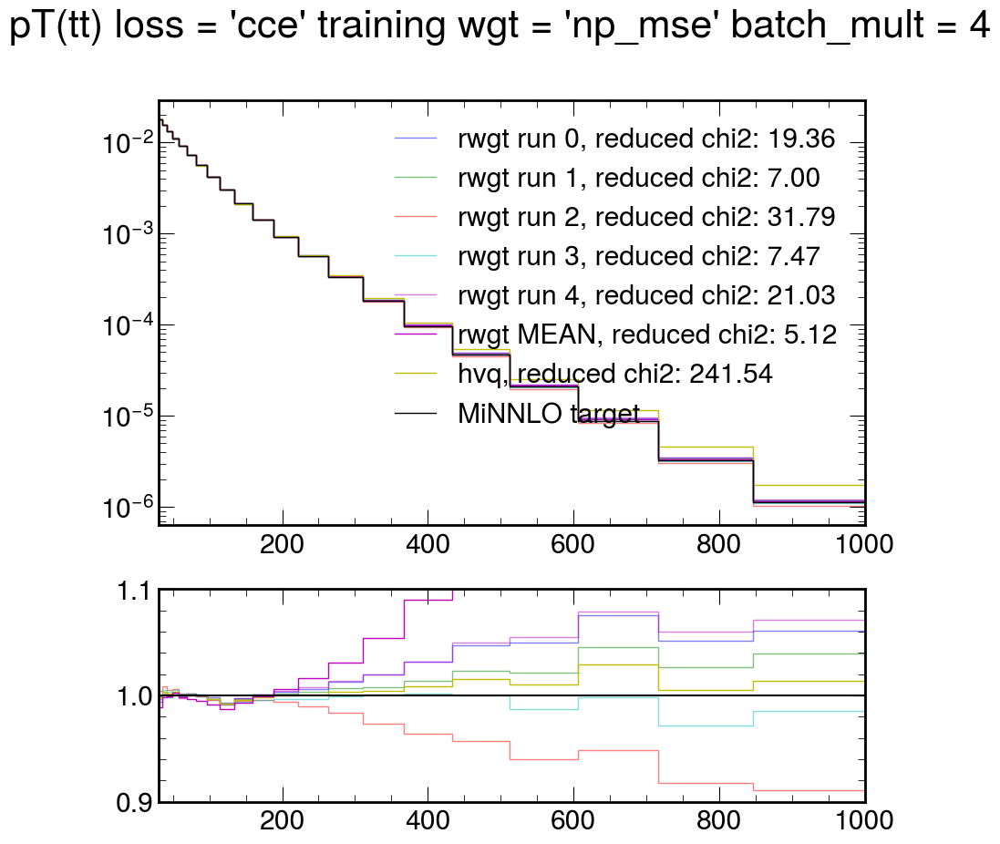

starting with wgt = 'np_cce' batch_mult = 4 and loss = 'cce'
(7, 3, 21)


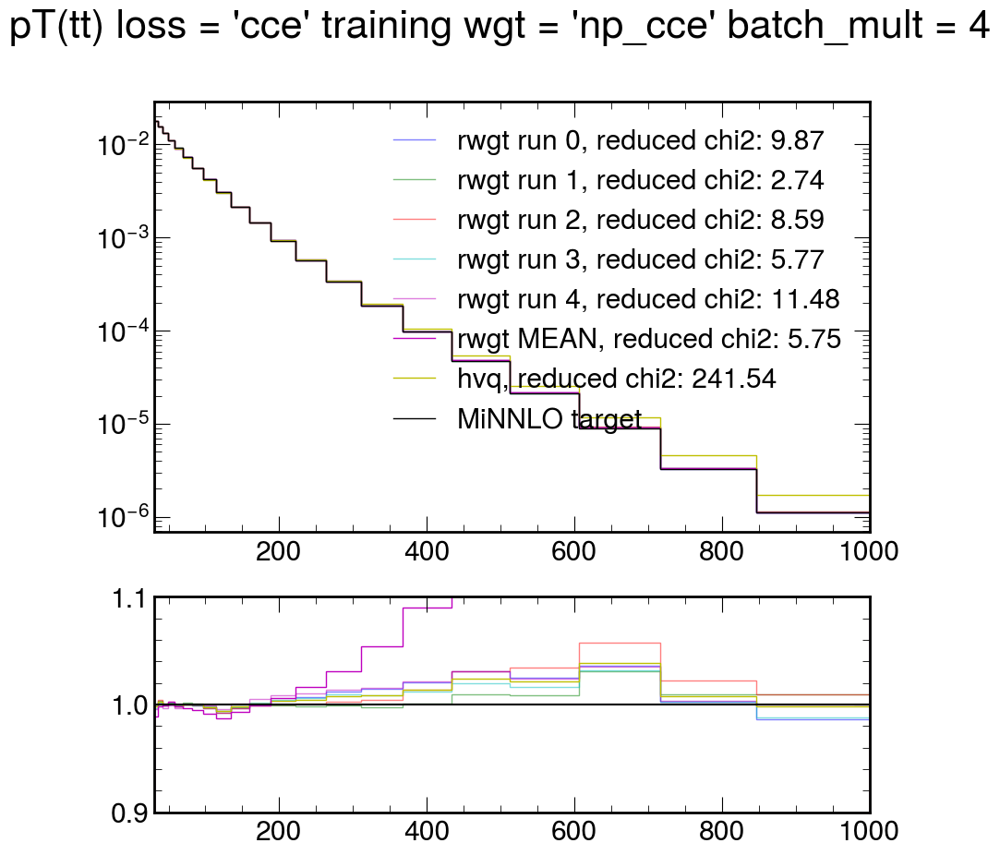

starting with wgt = 'org' batch_mult = 8 and loss = 'cce'
(7, 3, 21)


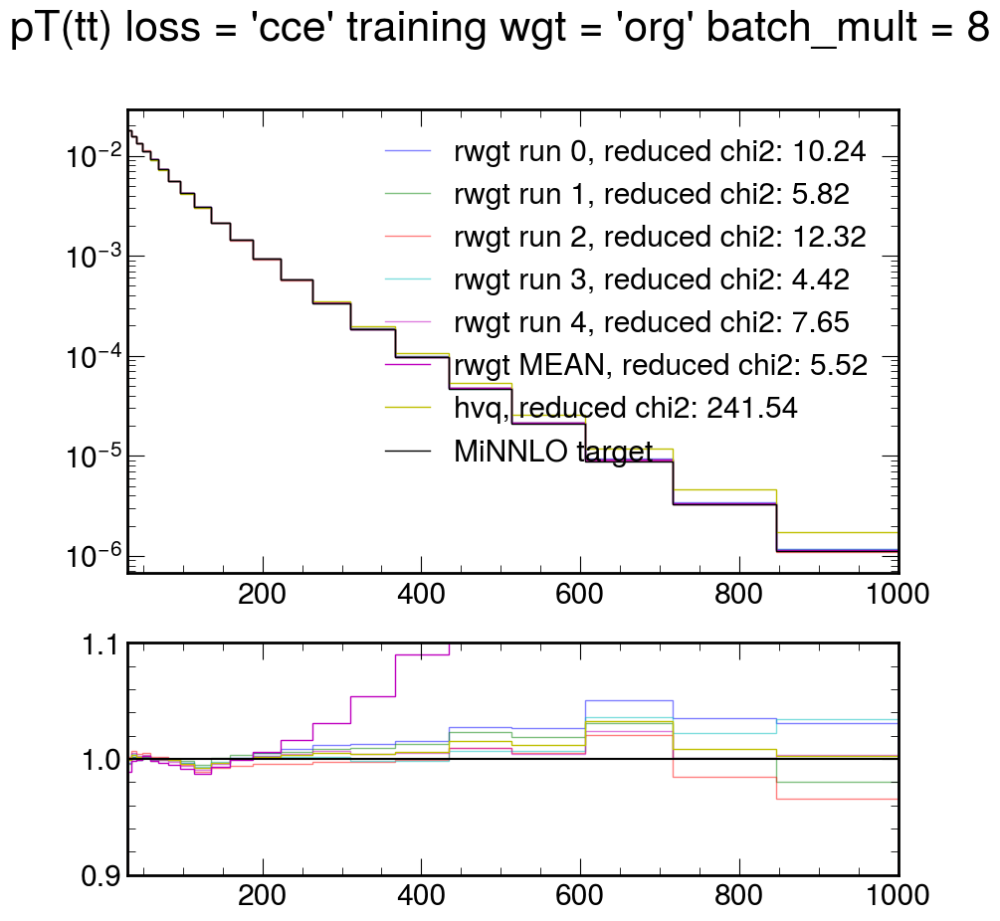

starting with wgt = 'np_mse' batch_mult = 8 and loss = 'cce'
(7, 3, 21)


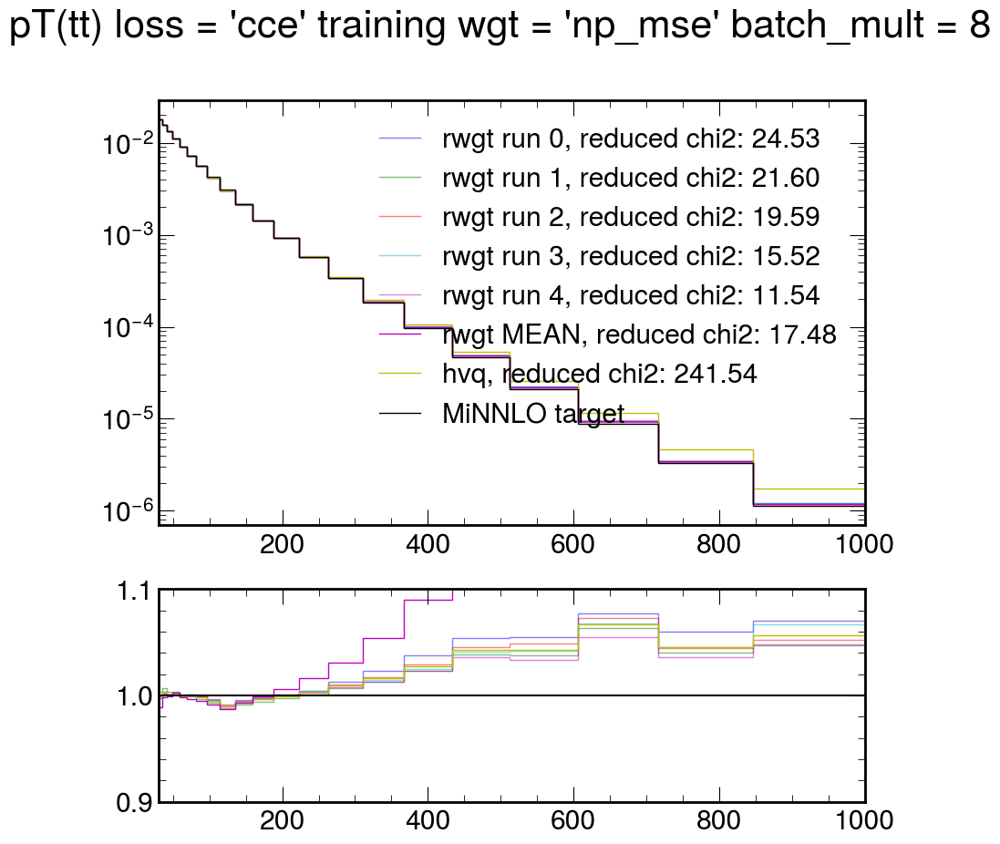

starting with wgt = 'np_cce' batch_mult = 8 and loss = 'cce'
(7, 3, 21)


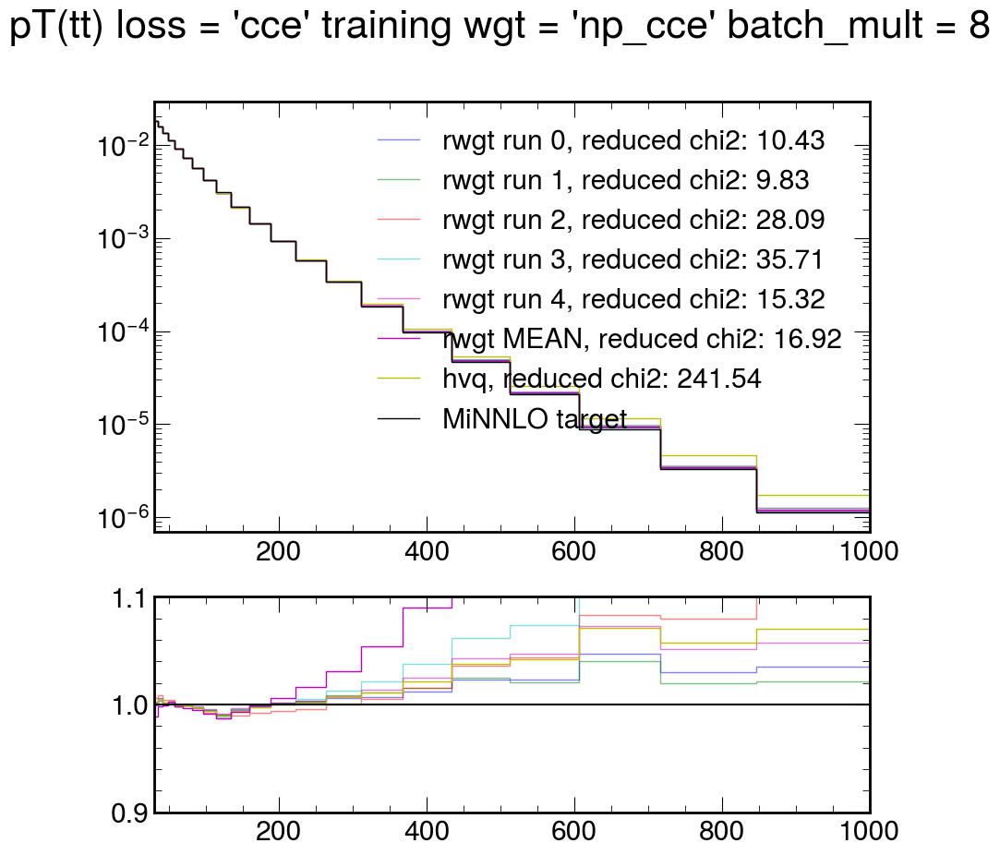

starting with wgt = 'org' batch_mult = 16 and loss = 'cce'
(7, 3, 21)


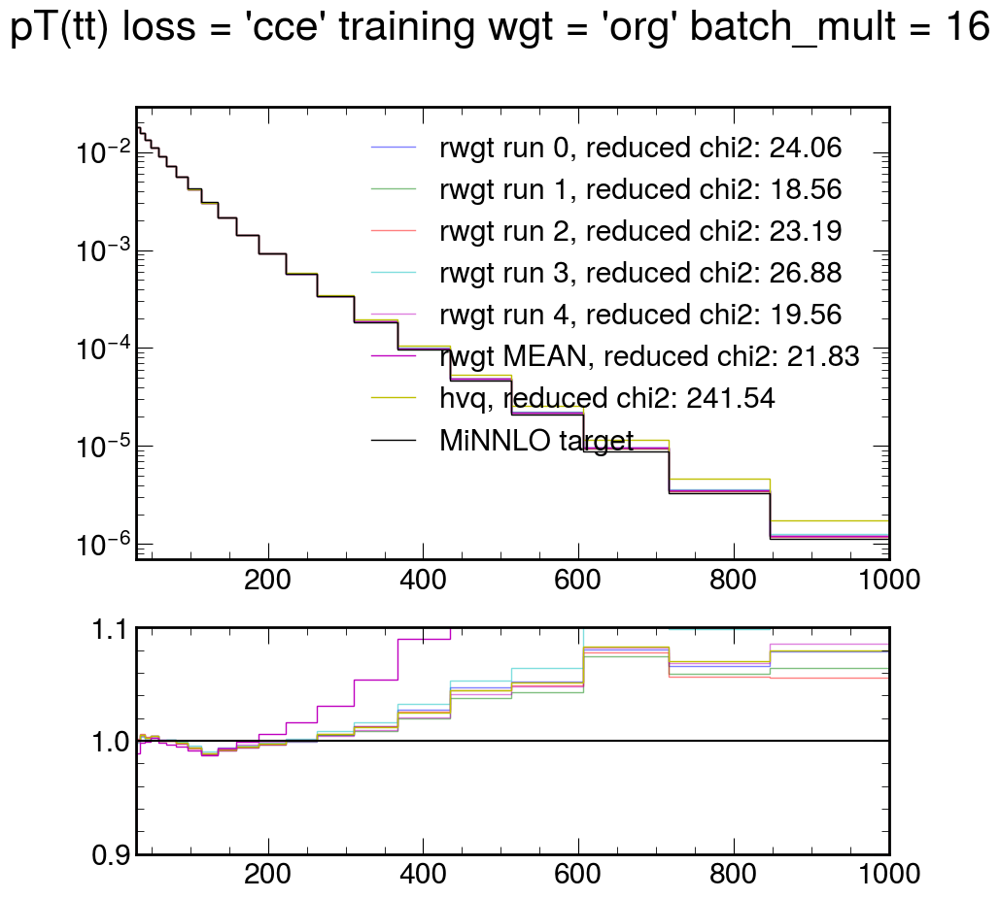

starting with wgt = 'np_mse' batch_mult = 16 and loss = 'cce'
(7, 3, 21)


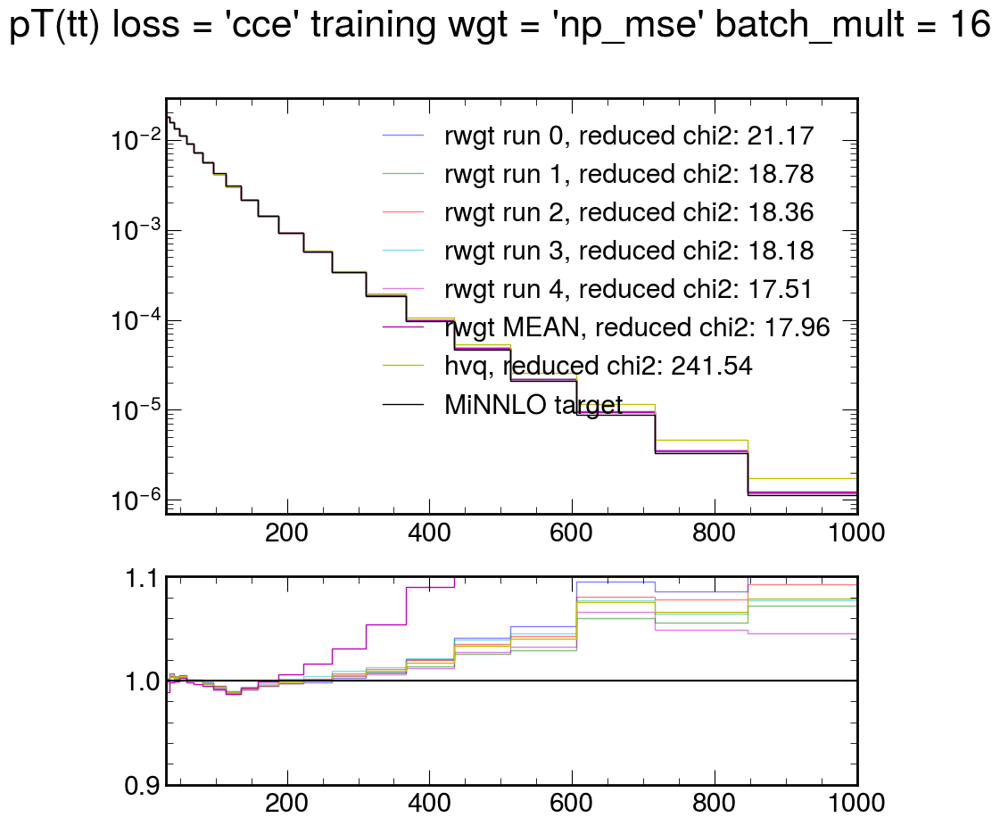

starting with wgt = 'np_cce' batch_mult = 16 and loss = 'cce'
(7, 3, 21)


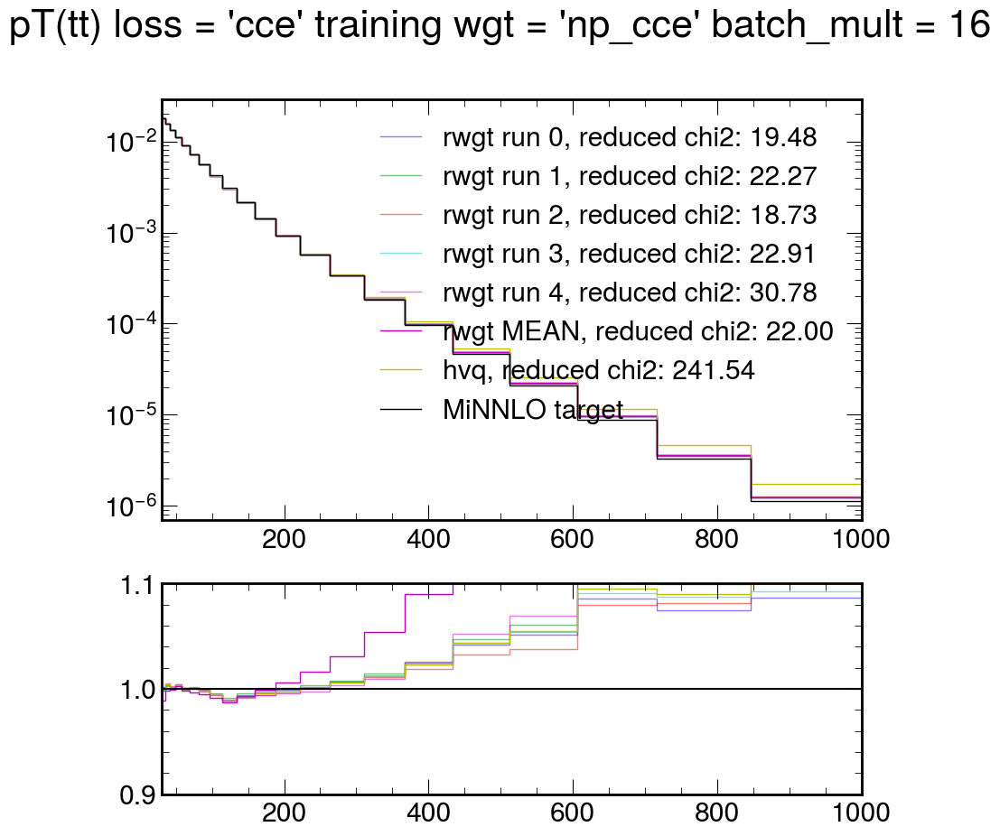

starting with wgt = 'org' batch_mult = 32 and loss = 'cce'
(7, 3, 21)


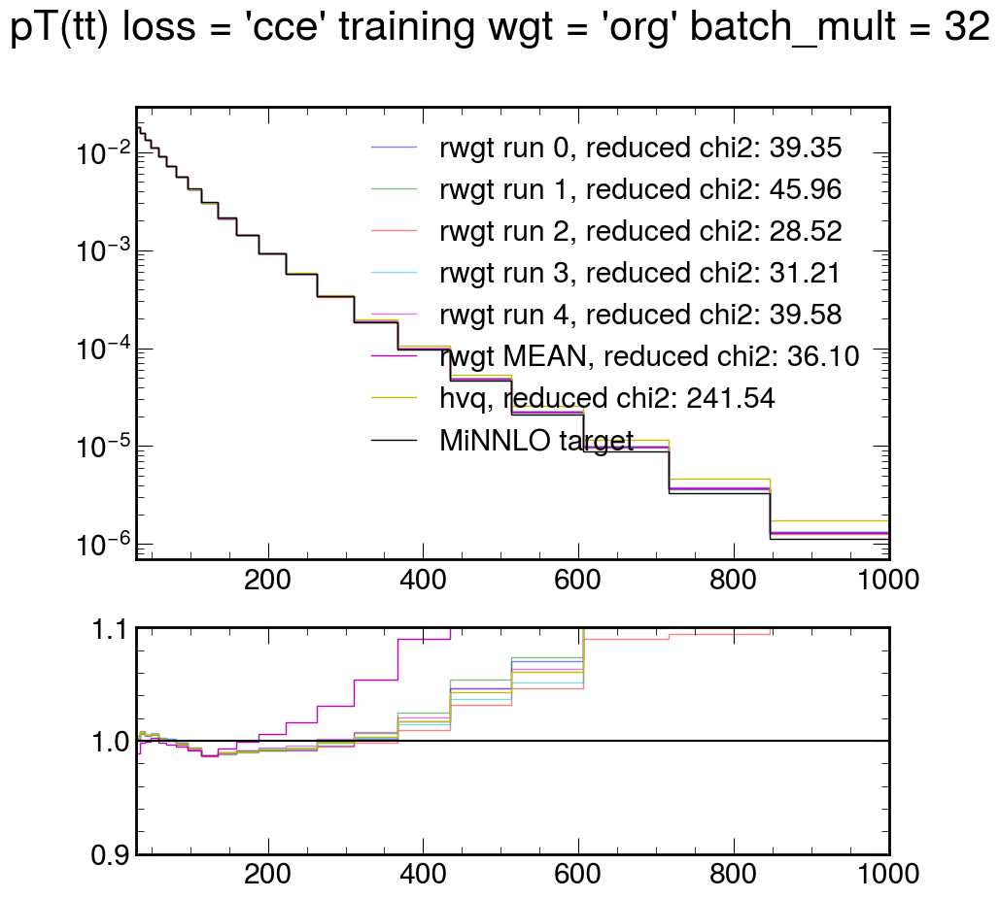

starting with wgt = 'np_mse' batch_mult = 32 and loss = 'cce'
(7, 3, 21)


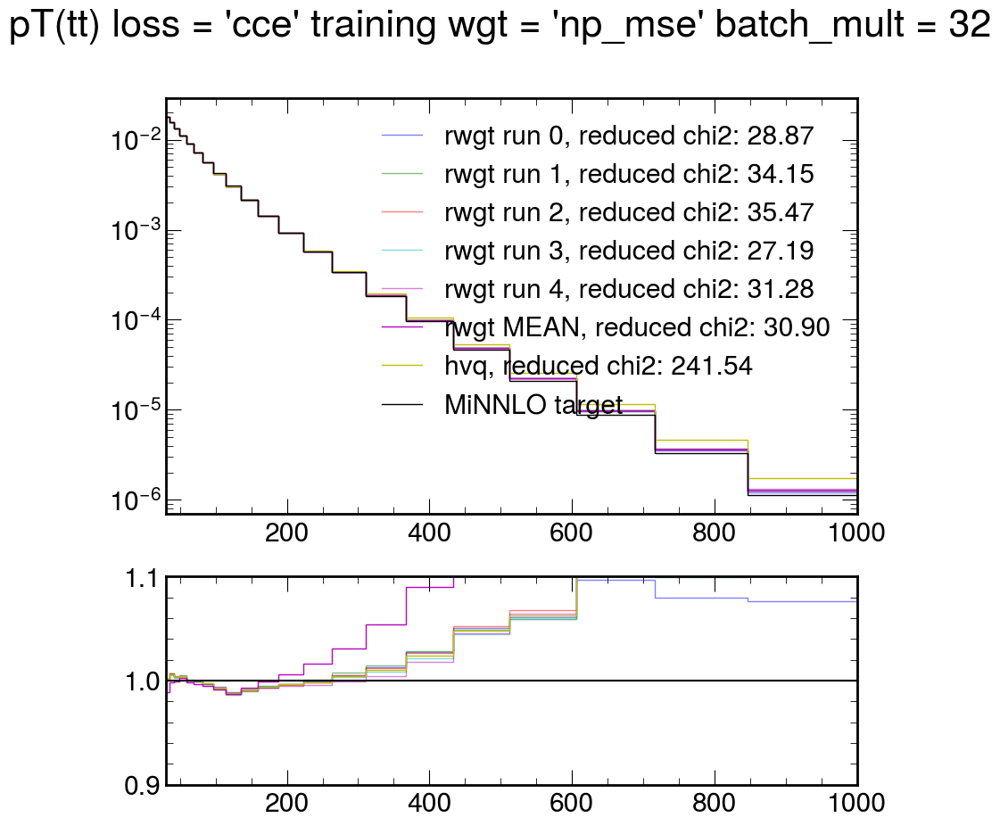

starting with wgt = 'np_cce' batch_mult = 32 and loss = 'cce'
(7, 3, 21)


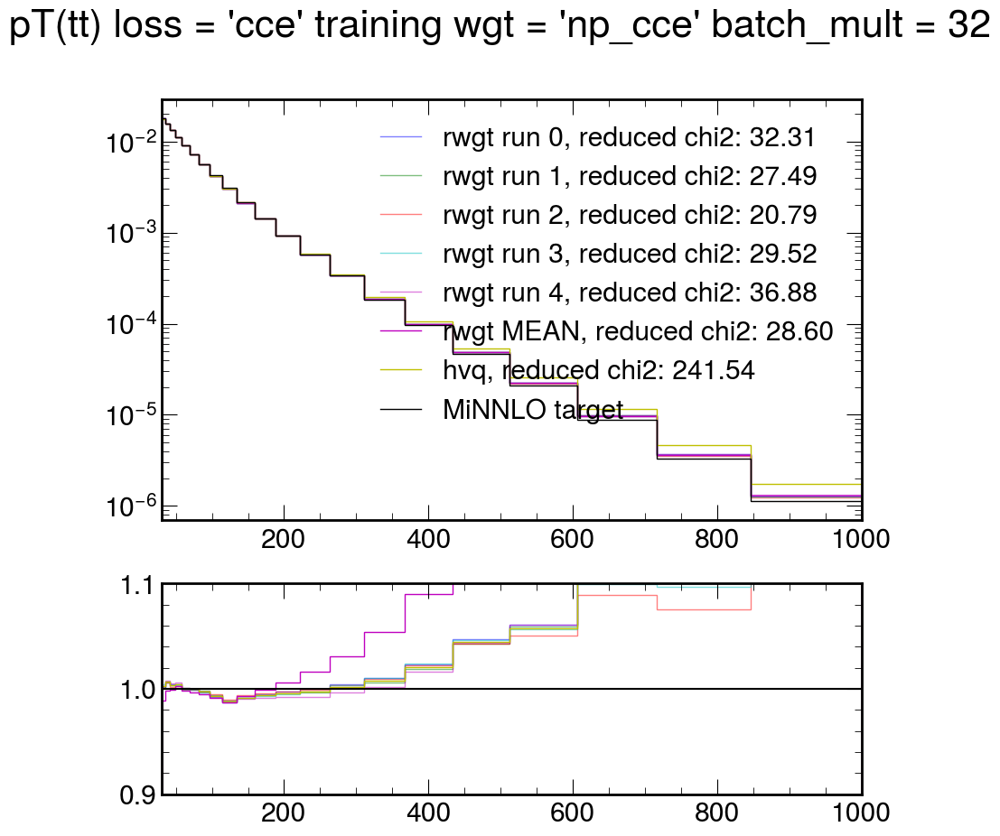

In [57]:
N = len(x1_plt)
ratio_ylim = [0.9, 1.1]

colors = ['b','g','r','c','m','y','k']
start = pt_bins[0]
stop = pt_bins[-1]

for loss in losses:
    for batch_mult in batch_sizes:
        for wgt in wgts:
            print(f'starting with {wgt = } {batch_mult = } and {loss = }')
            
            batch_size = batch_mult*8192
        
            label = f'DCTR_NNLO_wgt_{wgt}_loss_{loss}_batchsize_{batch_size}_hists'
            batch_hists = np.load(f'{save_path}{label}.npy')
            print(batch_hists.shape)
        
            # pt
            fig, ax = plt.subplots(nrows=2,gridspec_kw={'height_ratios': [2, 1]})
            fig.suptitle(f'pT(tt) {loss = } training {wgt = } {batch_mult = }')
            for i in range(0, runs):
                pt_hist = batch_hists[i][0]
                reduced_chi2 = reduced_chi2_test(pt_hist, x1_pt_hist, pt_bins, N)
                ax[0].stairs(pt_hist, pt_bins, label=f'rwgt run {i}, reduced chi2: {reduced_chi2:.2f}', color = colors[i], alpha = 0.5)
        
            pt_hist_mean = batch_hists[-2][0] # last two are mean and std
            # pt_hist_std  = batch_hists[-1][0]
            reduced_chi2 = reduced_chi2_test(pt_hist_mean, x1_pt_hist, pt_bins, N)
            ax[0].stairs(pt_hist_mean, pt_bins, label=f'rwgt MEAN, reduced chi2: {reduced_chi2:.2f}', color=colors[-3])
        
            reduced_chi2 = reduced_chi2_test(x0_pt_hist, x1_pt_hist, pt_bins, N)
            ax[0].stairs(x0_pt_hist, pt_bins, label=f'hvq, reduced chi2: {reduced_chi2:.2f}', color=colors[-2])
            ax[0].stairs(x1_pt_hist, pt_bins, label=f'MiNNLO target', color='black')
            ax[0].set_yscale('log')
            ax[0].legend()
            
            # ratio plot
            for i in range(0, runs):
                pt_hist = batch_hists[i][0]
                ratio = pt_hist/x1_pt_hist
                ax[1].stairs(ratio, pt_bins, label=f'rwgt run {i}, reduced chi2: {reduced_chi2:.2f}', color = colors[i], alpha = 0.5)
                
            ratio_1 = x0_pt_hist/x1_pt_hist
            ratio_2 = pt_hist_mean/x1_pt_hist
            
            ax[1].plot([start, stop], [1,1], '-', color='black', label='MiNNLO target')
            ax[1].stairs(ratio_2, pt_bins, label='mean rwgt', color=colors[-2])
            ax[1].stairs(ratio_1, pt_bins, label='hvq', color=colors[-3])

            ax[1].set_ylim(ratio_ylim)

            ax[0].set_xlim([start,stop])
            ax[1].set_xlim([start,stop])
            
            plt.show()


starting with wgt = 'org' batch_mult = 4 and loss = 'mse'
(7, 3, 21)


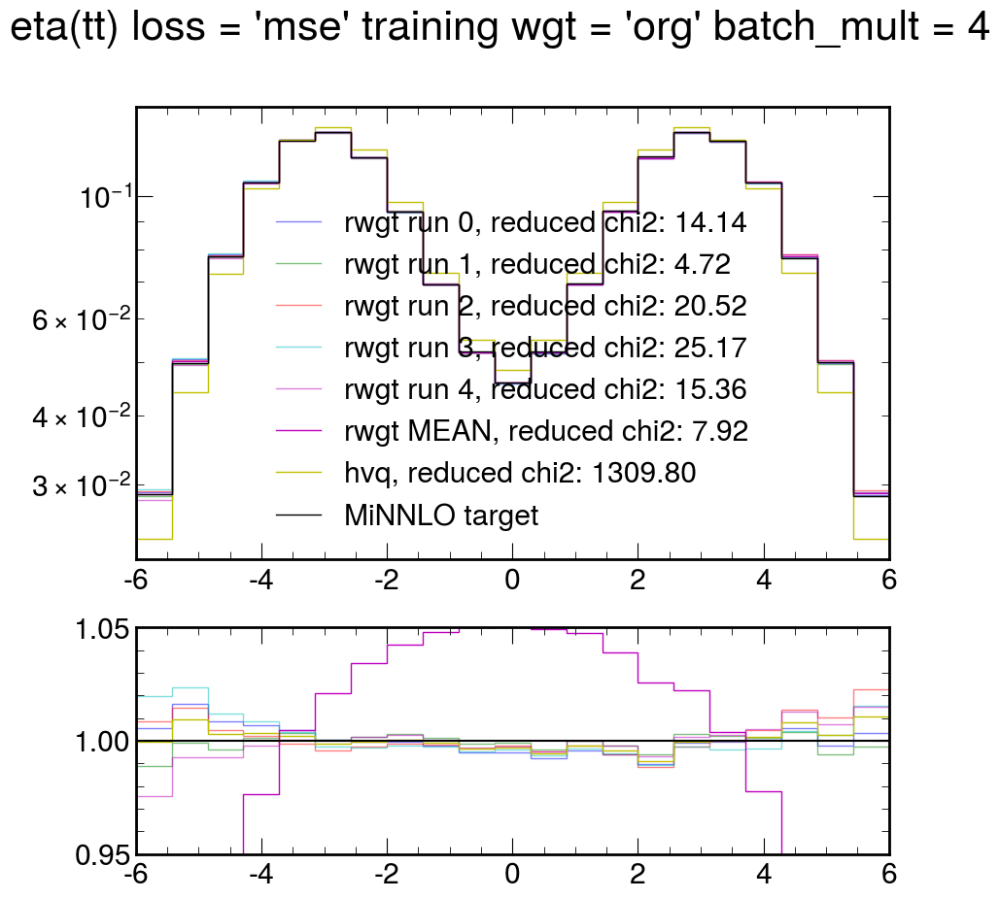

starting with wgt = 'np_mse' batch_mult = 4 and loss = 'mse'
(7, 3, 21)


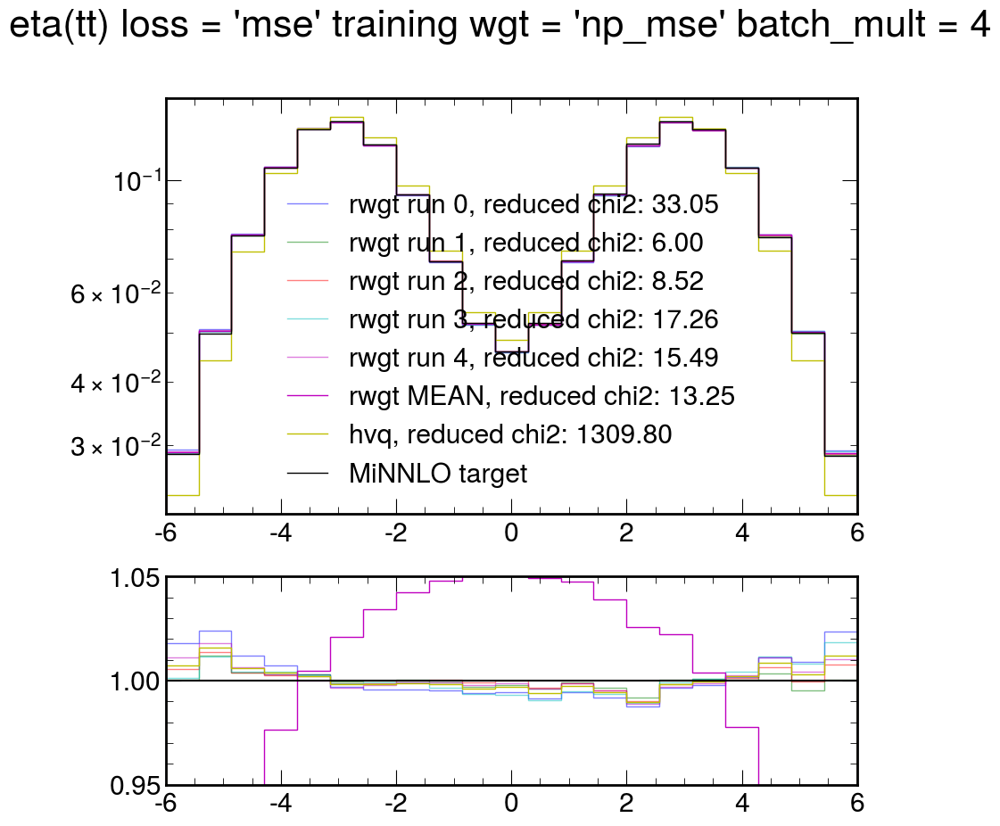

starting with wgt = 'np_cce' batch_mult = 4 and loss = 'mse'
(7, 3, 21)


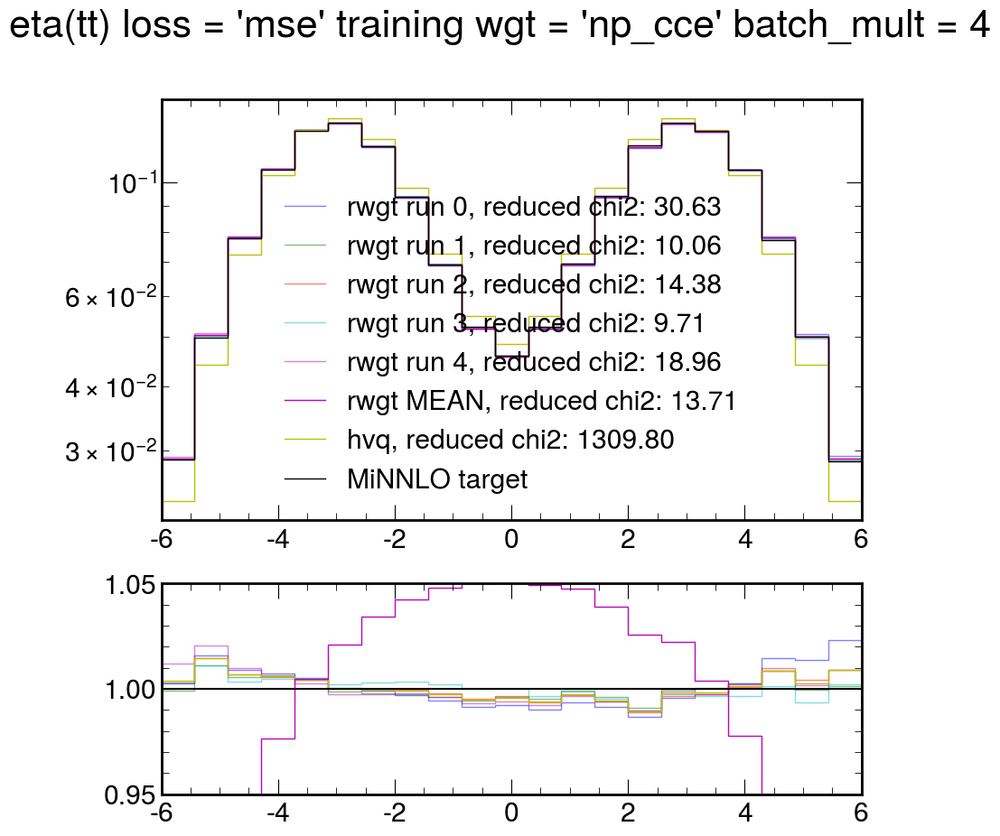

starting with wgt = 'org' batch_mult = 8 and loss = 'mse'
(7, 3, 21)


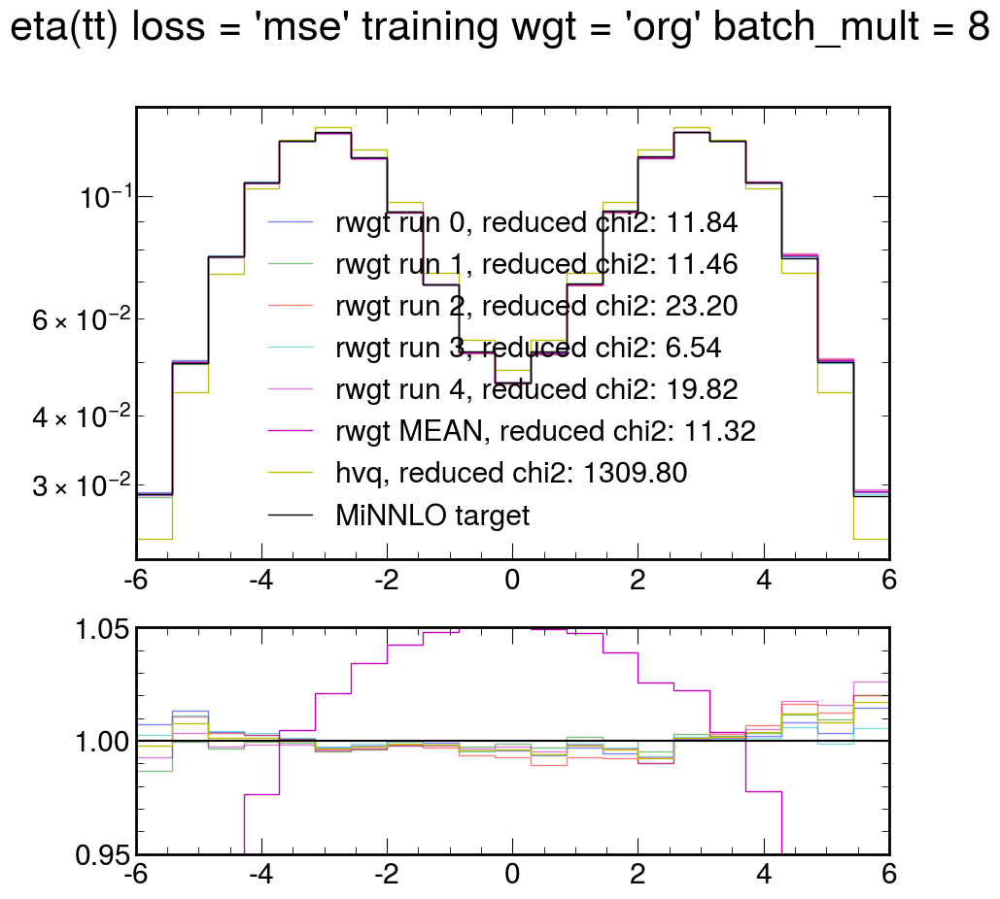

starting with wgt = 'np_mse' batch_mult = 8 and loss = 'mse'
(7, 3, 21)


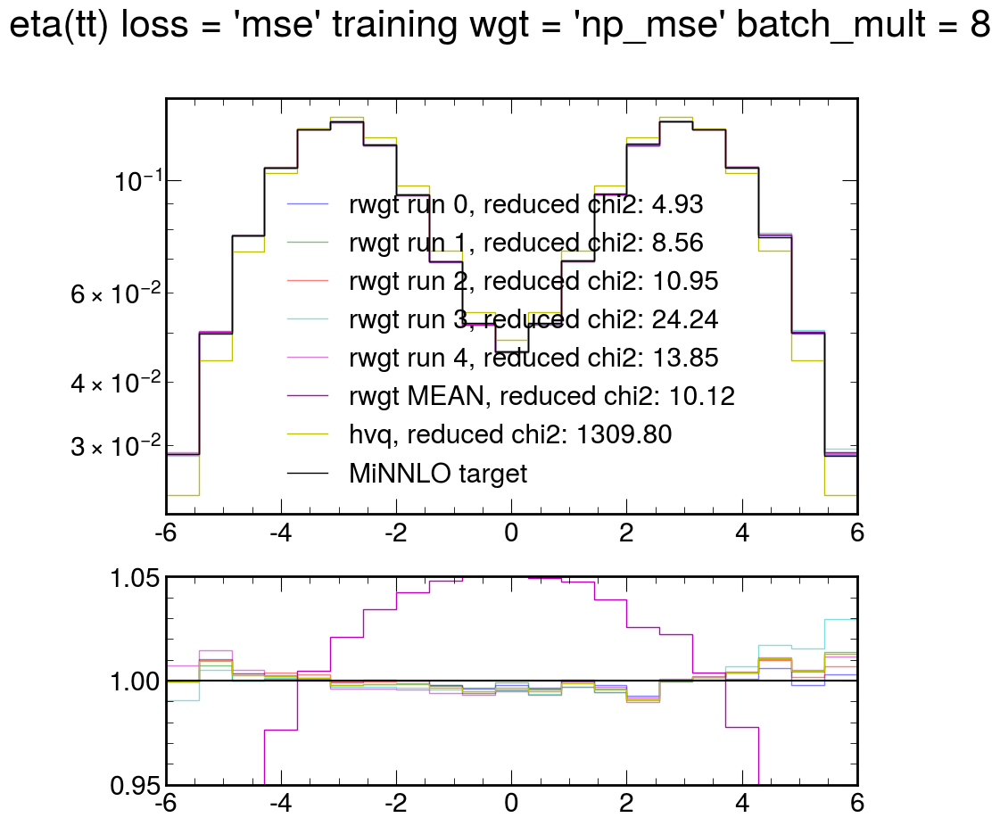

starting with wgt = 'np_cce' batch_mult = 8 and loss = 'mse'
(7, 3, 21)


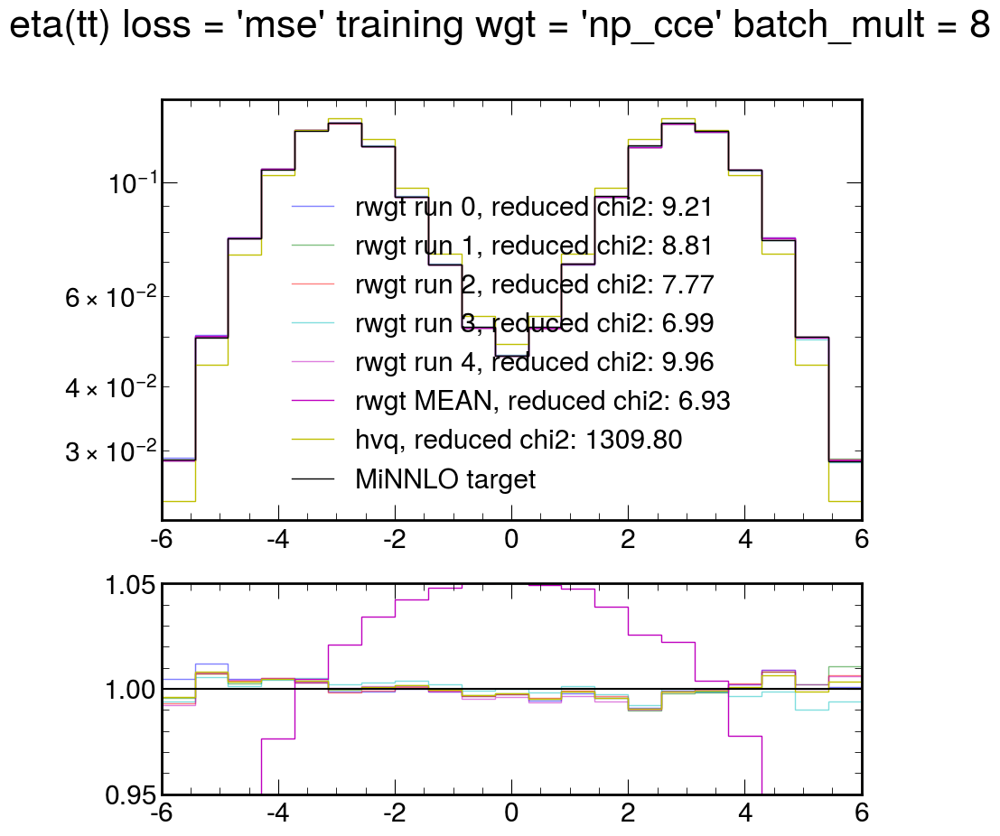

starting with wgt = 'org' batch_mult = 16 and loss = 'mse'
(7, 3, 21)


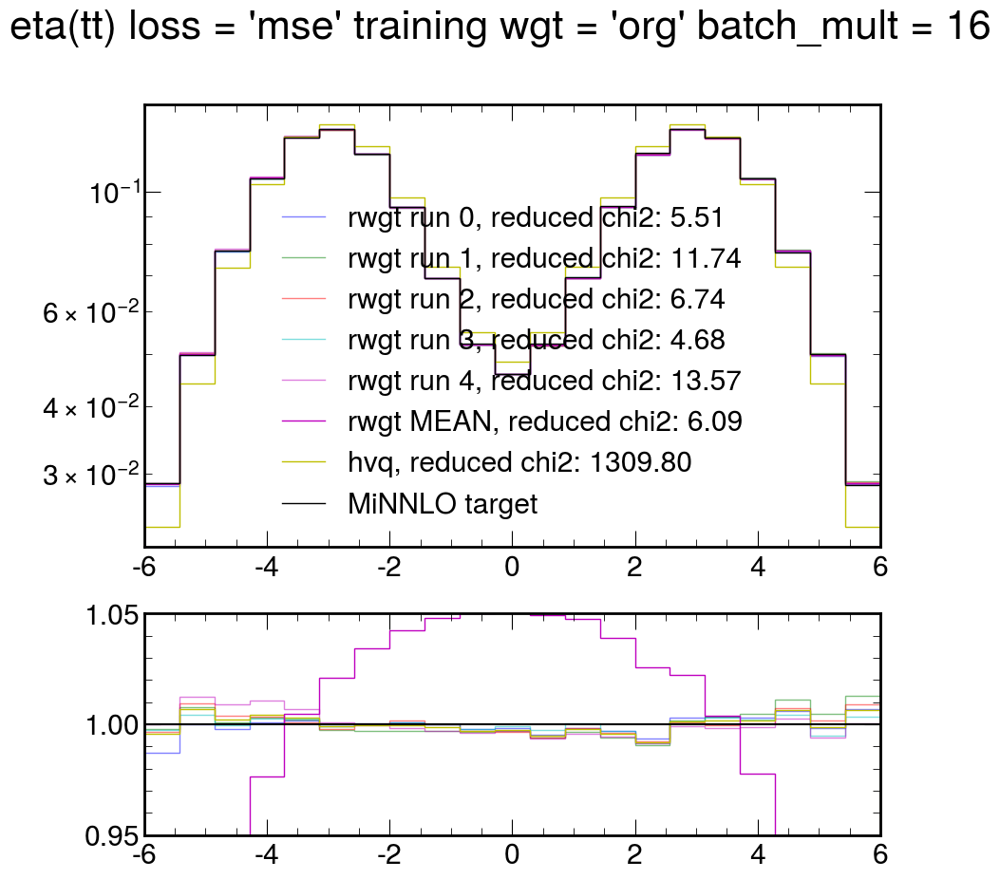

starting with wgt = 'np_mse' batch_mult = 16 and loss = 'mse'
(7, 3, 21)


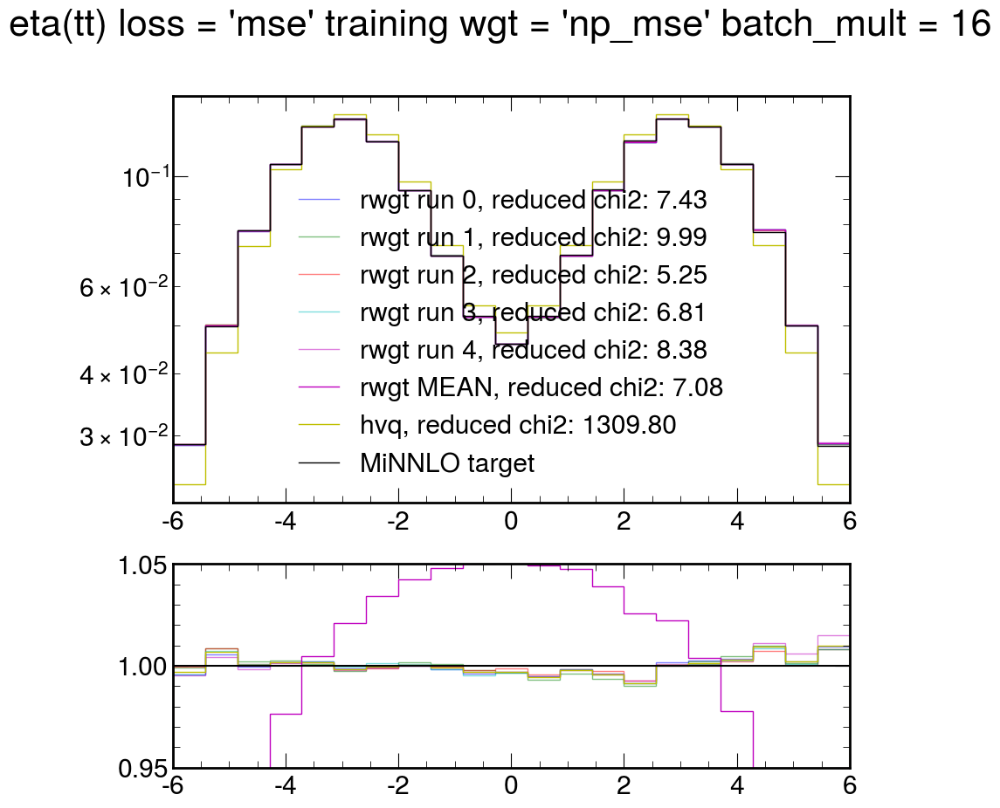

starting with wgt = 'np_cce' batch_mult = 16 and loss = 'mse'
(7, 3, 21)


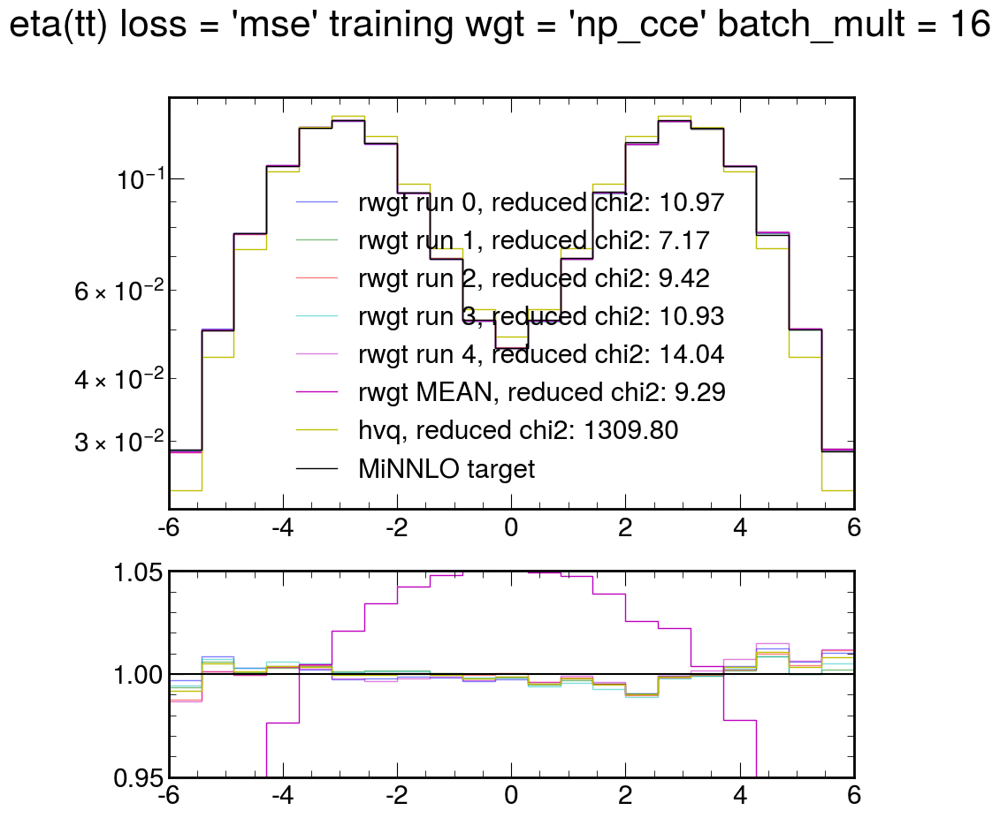

starting with wgt = 'org' batch_mult = 32 and loss = 'mse'
(7, 3, 21)


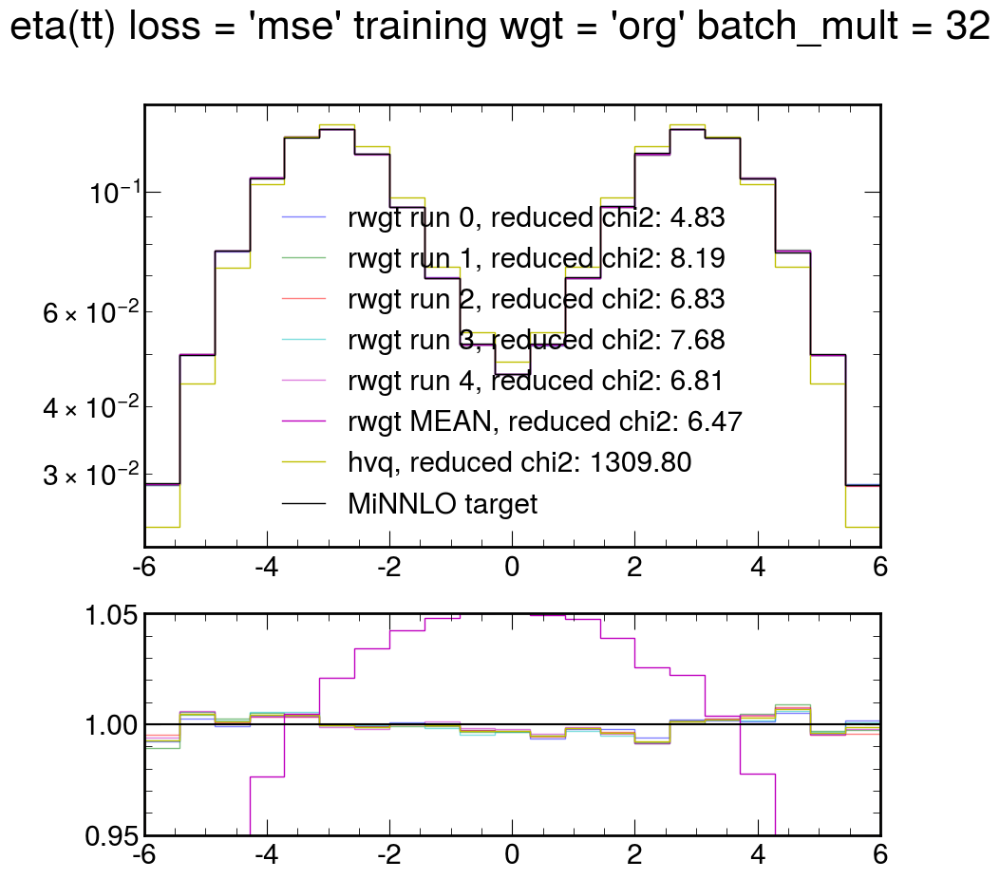

starting with wgt = 'np_mse' batch_mult = 32 and loss = 'mse'
(7, 3, 21)


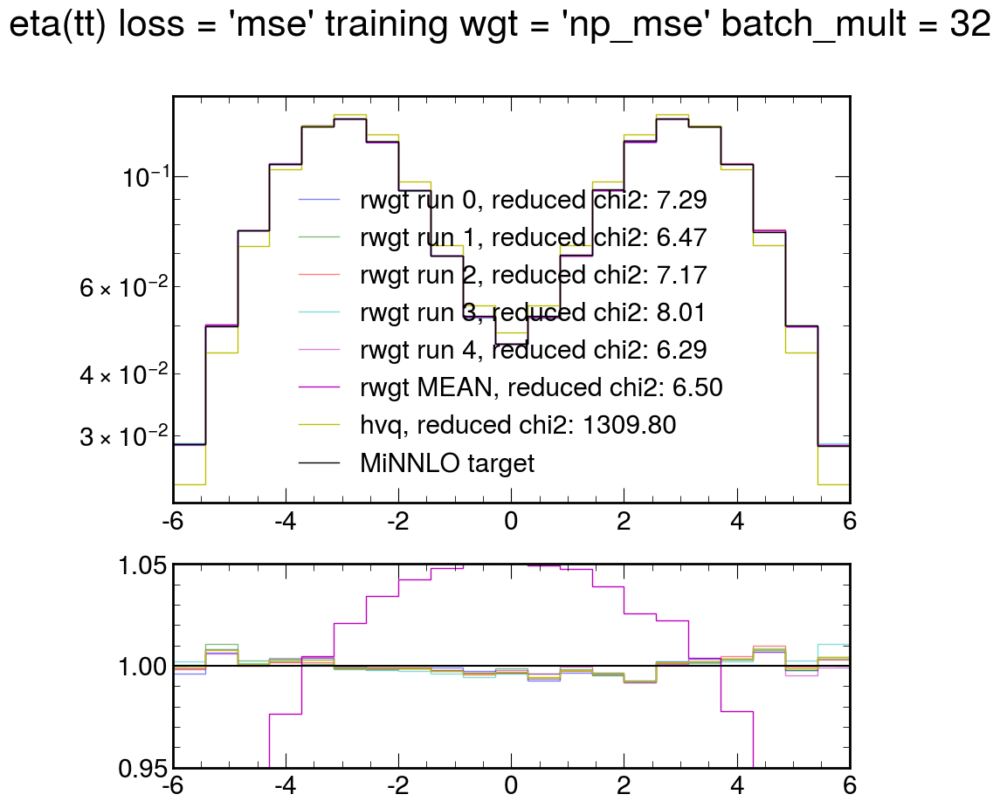

starting with wgt = 'np_cce' batch_mult = 32 and loss = 'mse'
(7, 3, 21)


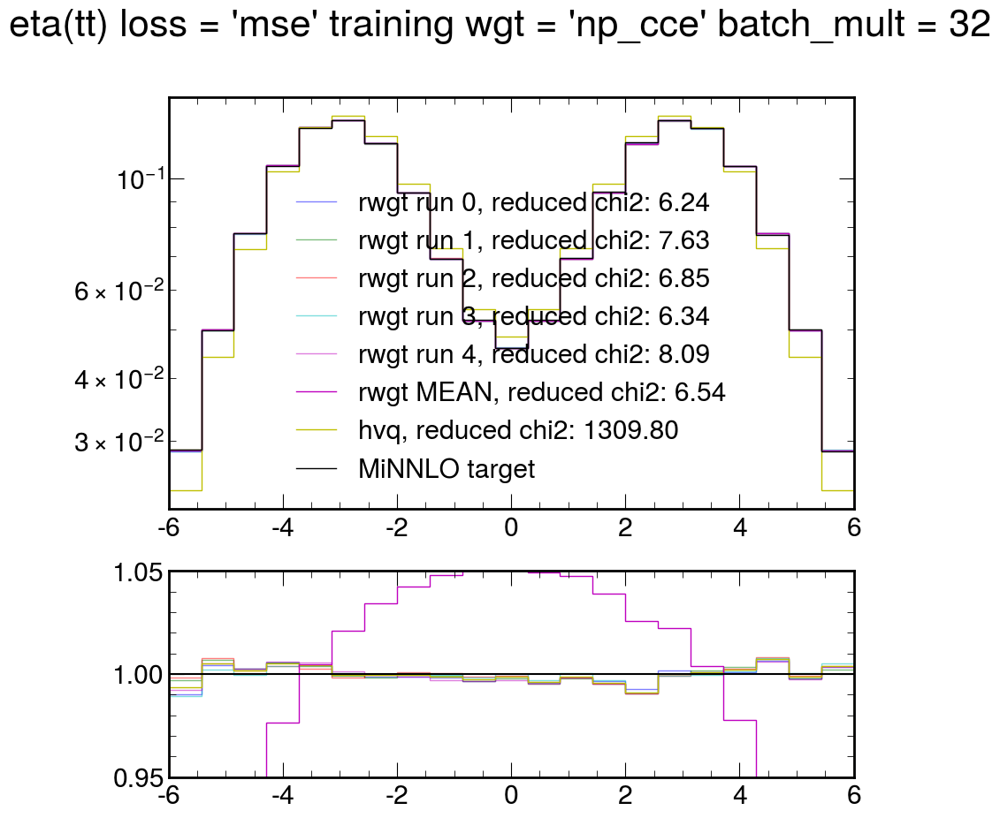

starting with wgt = 'org' batch_mult = 4 and loss = 'cce'
(7, 3, 21)


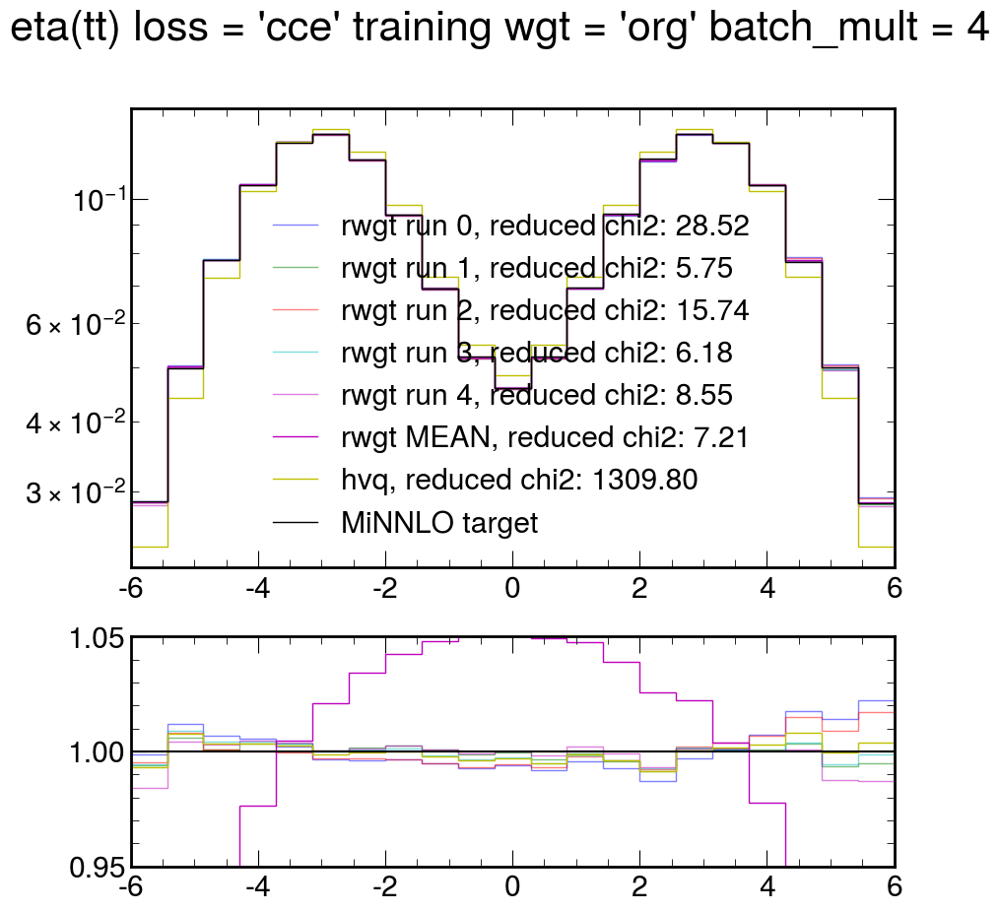

starting with wgt = 'np_mse' batch_mult = 4 and loss = 'cce'
(7, 3, 21)


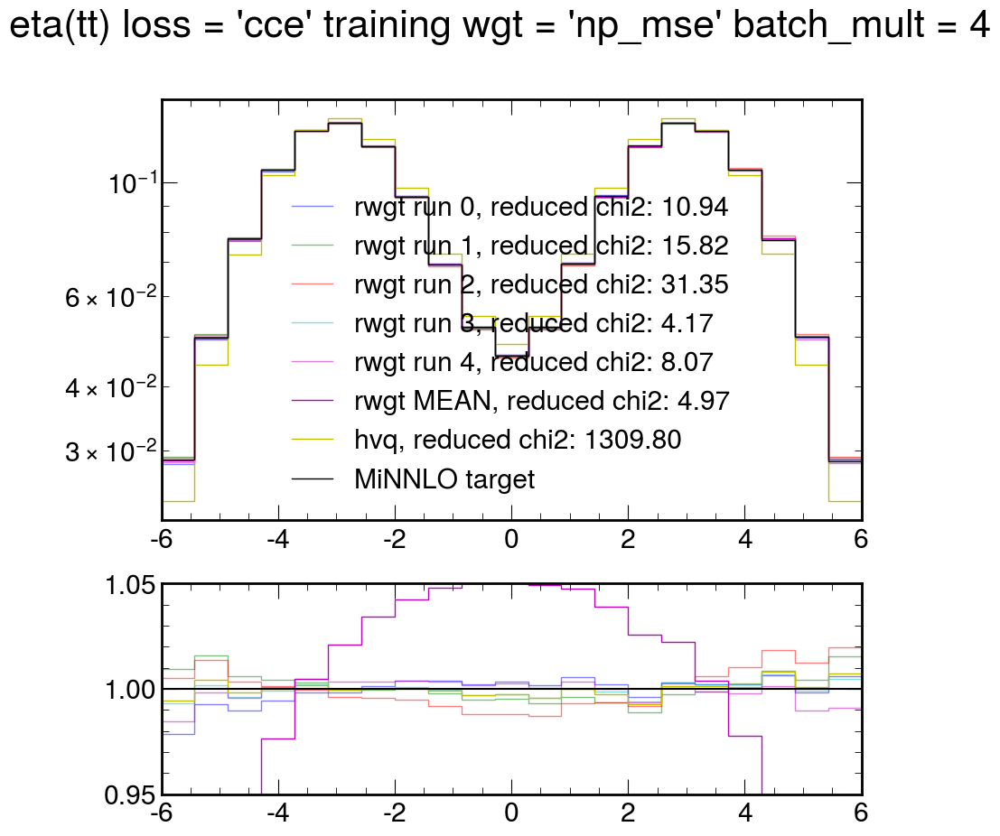

starting with wgt = 'np_cce' batch_mult = 4 and loss = 'cce'
(7, 3, 21)


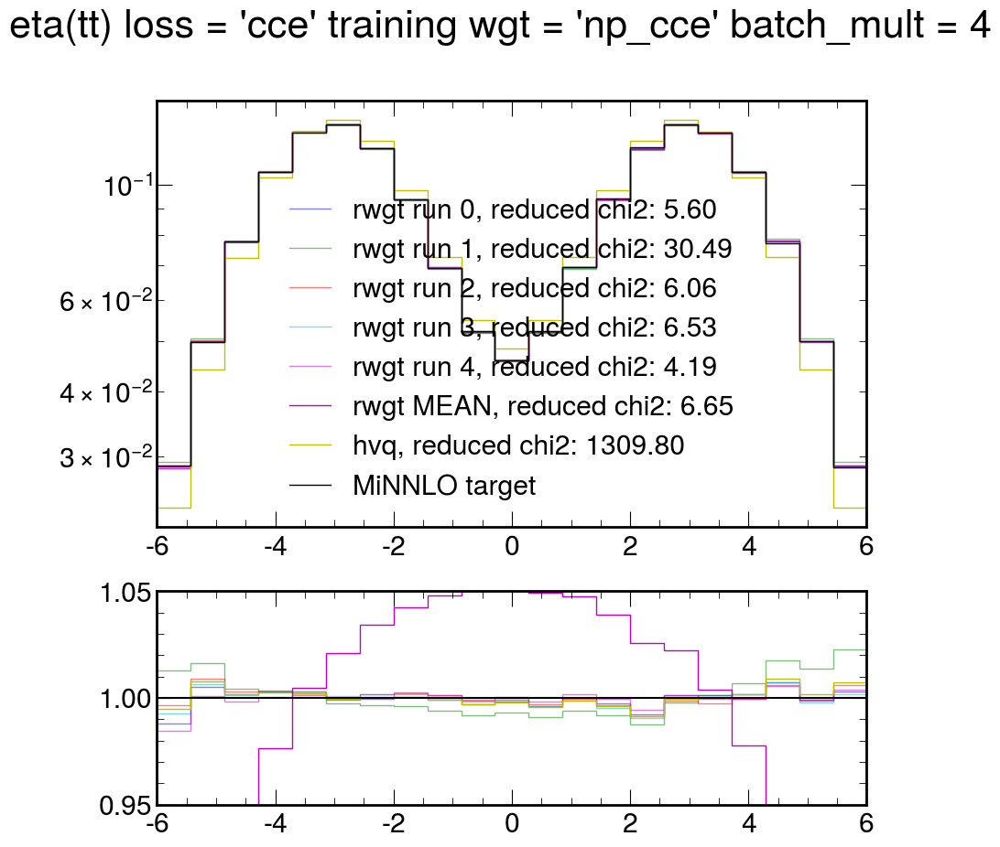

starting with wgt = 'org' batch_mult = 8 and loss = 'cce'
(7, 3, 21)


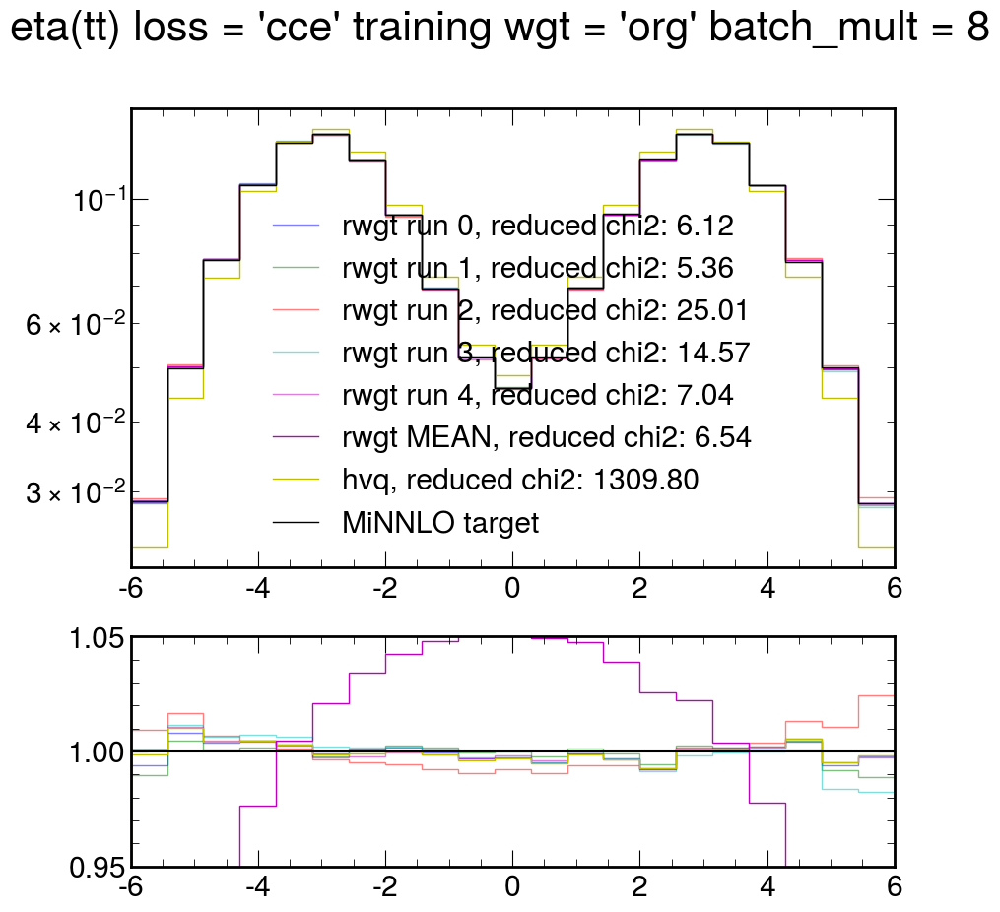

starting with wgt = 'np_mse' batch_mult = 8 and loss = 'cce'
(7, 3, 21)


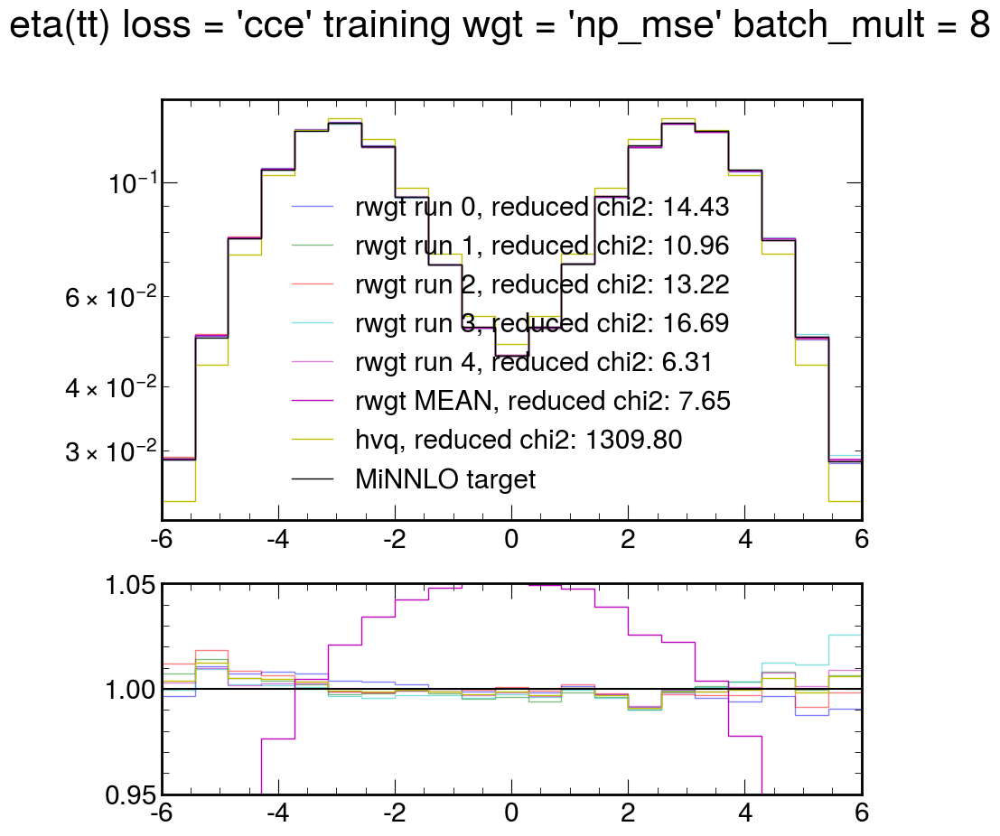

starting with wgt = 'np_cce' batch_mult = 8 and loss = 'cce'
(7, 3, 21)


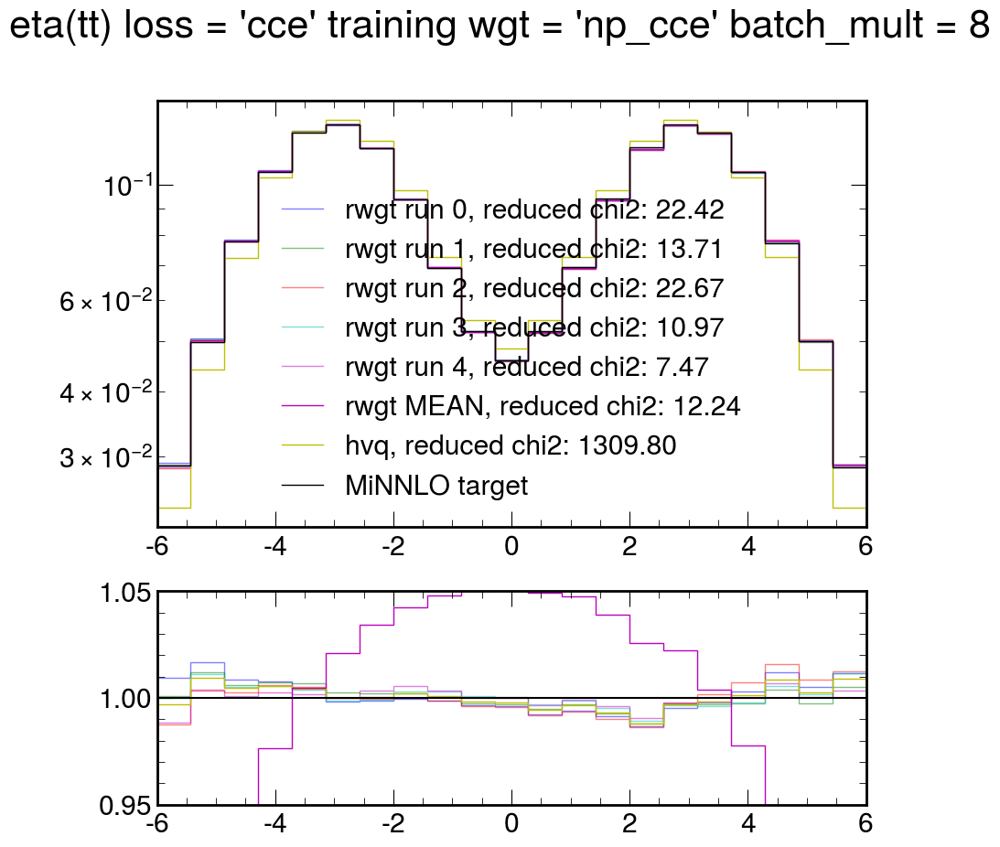

starting with wgt = 'org' batch_mult = 16 and loss = 'cce'
(7, 3, 21)


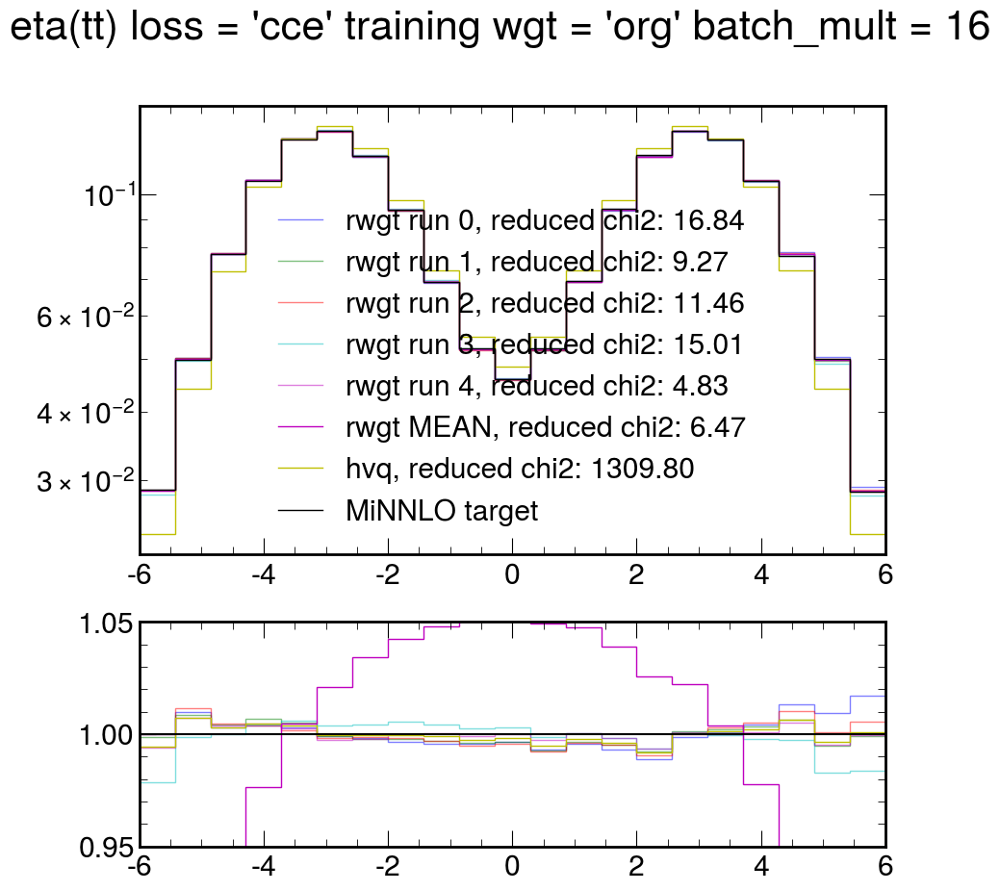

starting with wgt = 'np_mse' batch_mult = 16 and loss = 'cce'
(7, 3, 21)


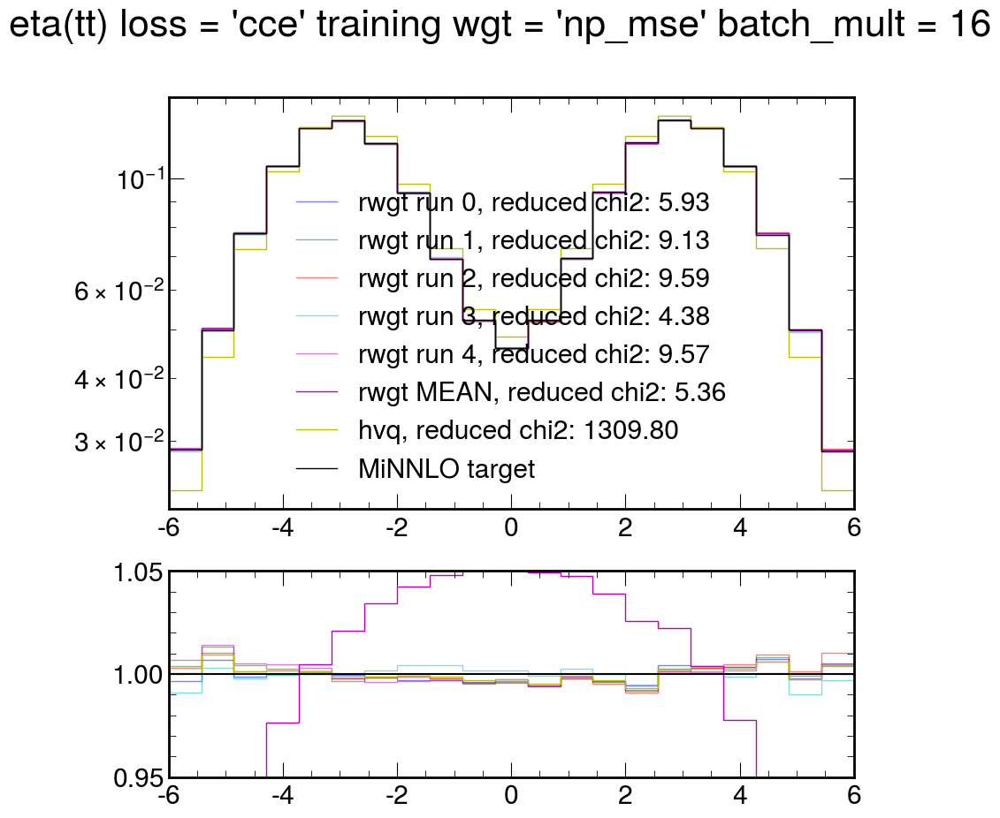

starting with wgt = 'np_cce' batch_mult = 16 and loss = 'cce'
(7, 3, 21)


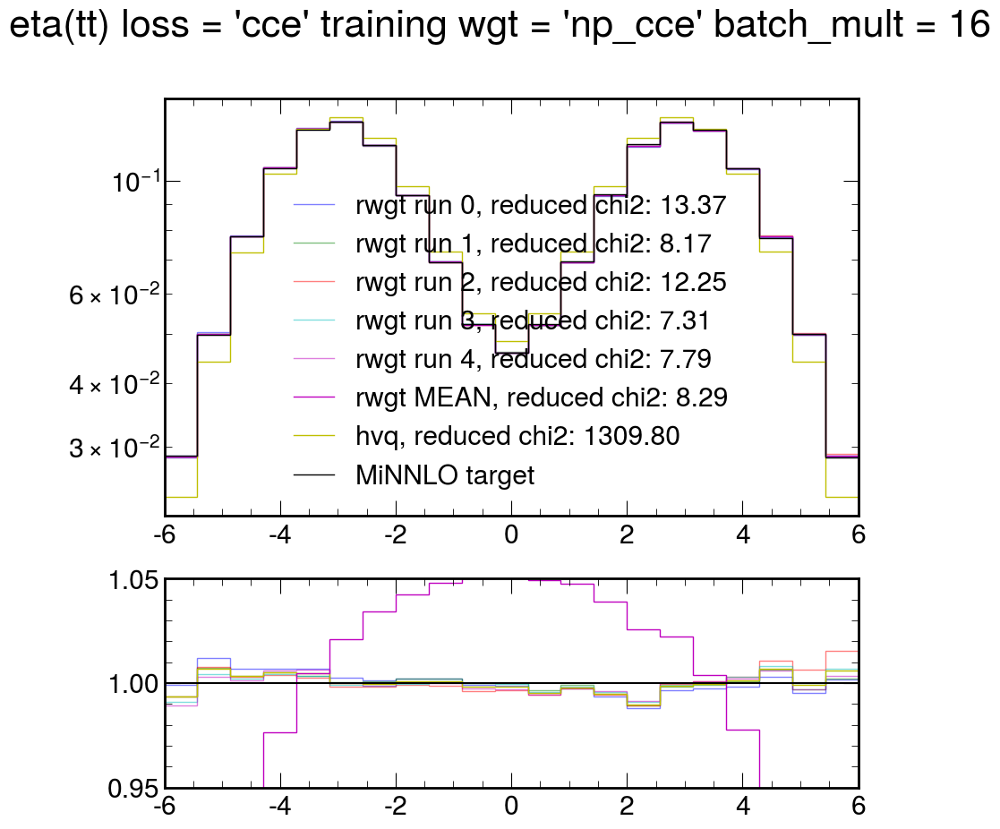

starting with wgt = 'org' batch_mult = 32 and loss = 'cce'
(7, 3, 21)


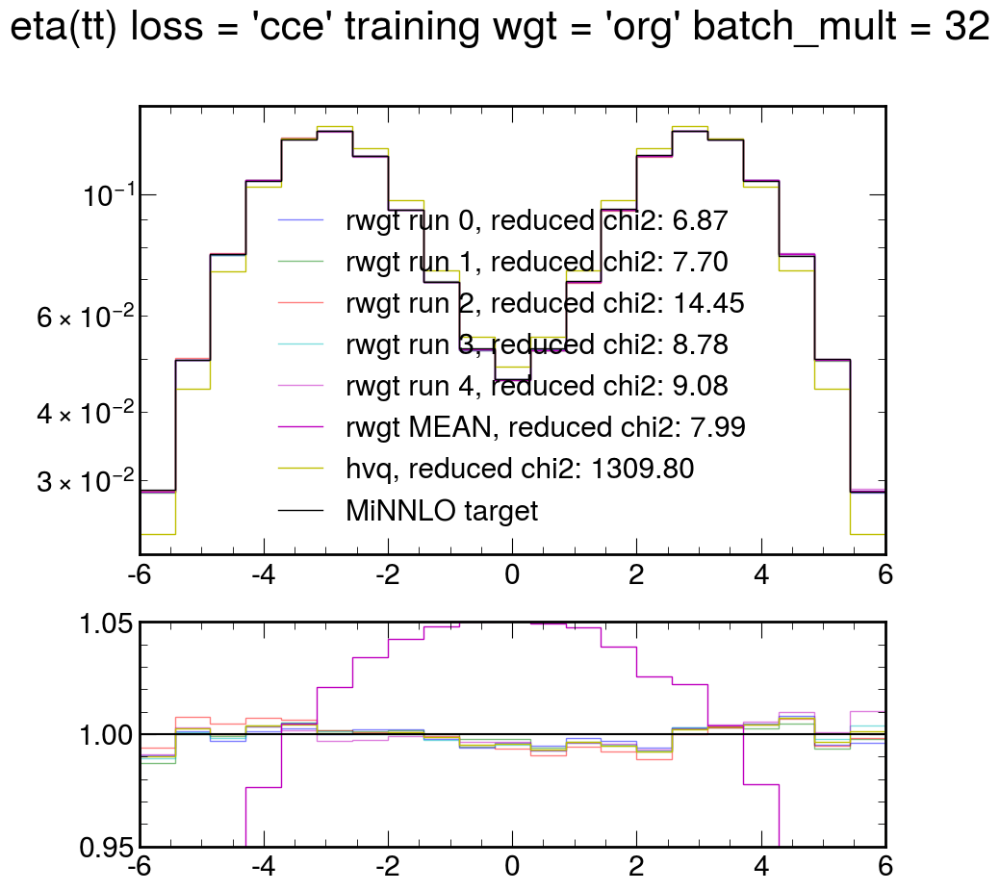

starting with wgt = 'np_mse' batch_mult = 32 and loss = 'cce'
(7, 3, 21)


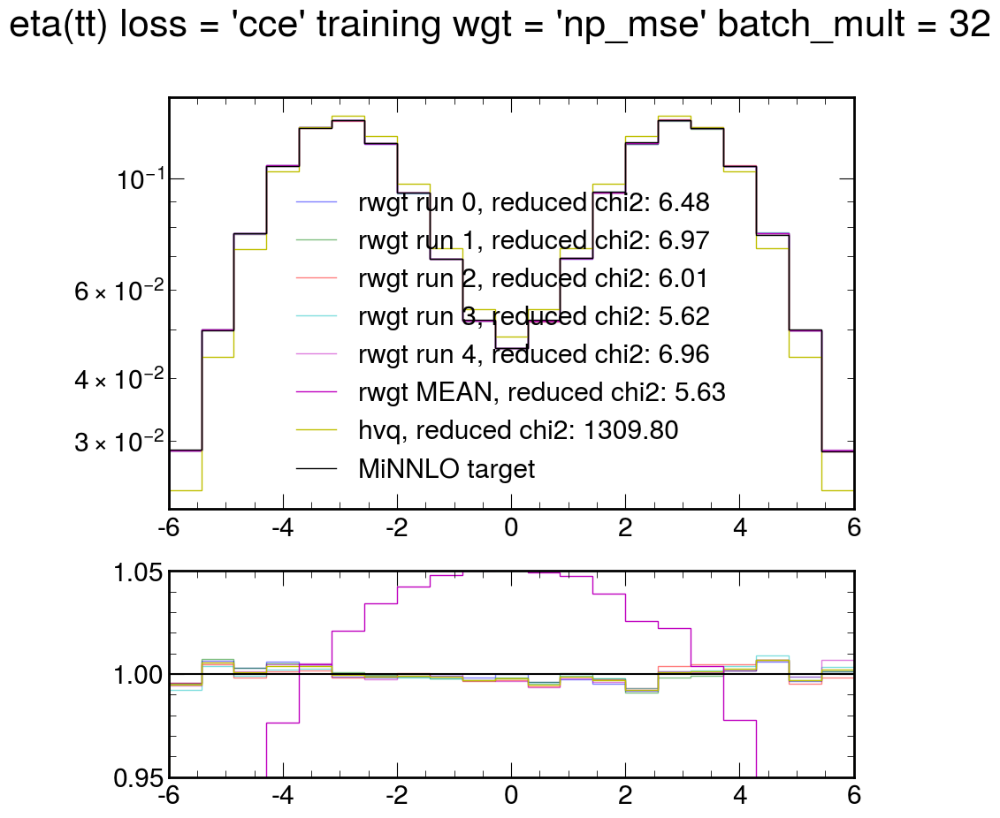

starting with wgt = 'np_cce' batch_mult = 32 and loss = 'cce'
(7, 3, 21)


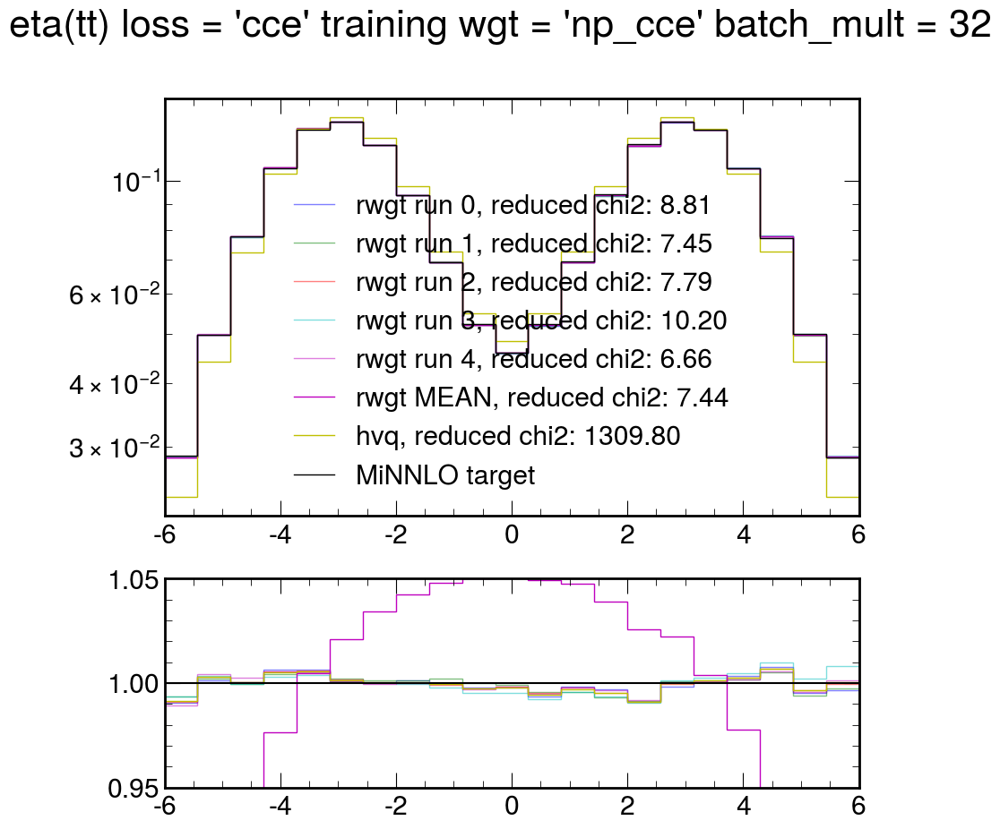

In [60]:

N = len(x1_plt)
ratio_ylim = [0.95, 1.05]

colors = ['b','g','r','c','m','y','k']
start = eta_bins[0]
stop = eta_bins[-1]

for loss in losses:
    for batch_mult in batch_sizes:
        for wgt in wgts:
            print(f'starting with {wgt = } {batch_mult = } and {loss = }')
            
            batch_size = batch_mult*8192
        
            label = f'DCTR_NNLO_wgt_{wgt}_loss_{loss}_batchsize_{batch_size}_hists'
            batch_hists = np.load(f'{save_path}{label}.npy')
            print(batch_hists.shape)
        
            # eta
            fig, ax = plt.subplots(nrows=2,gridspec_kw={'height_ratios': [2, 1]})
            fig.suptitle(f'eta(tt) {loss = } training {wgt = } {batch_mult = }')
            for i in range(0, runs):
                eta_hist = batch_hists[i][1]
                reduced_chi2 = reduced_chi2_test(eta_hist, x1_eta_hist, eta_bins, N)
                ax[0].stairs(eta_hist, eta_bins, label=f'rwgt run {i}, reduced chi2: {reduced_chi2:.2f}', color = colors[i], alpha = 0.5)
        
            eta_hist_mean = batch_hists[-2][1] # last two are mean and std
            # eta_hist_std  = batch_hists[-1][1]
            reduced_chi2 = reduced_chi2_test(eta_hist_mean, x1_eta_hist, eta_bins, N)
            ax[0].stairs(eta_hist_mean, eta_bins, label=f'rwgt MEAN, reduced chi2: {reduced_chi2:.2f}', color=colors[-3])
        
            reduced_chi2 = reduced_chi2_test(x0_eta_hist, x1_eta_hist, eta_bins, N)
            ax[0].stairs(x0_eta_hist, eta_bins, label=f'hvq, reduced chi2: {reduced_chi2:.2f}', color=colors[-2])
            ax[0].stairs(x1_eta_hist, eta_bins, label=f'MiNNLO target', color='black')
            ax[0].set_yscale('log')
            ax[0].legend()
            
            # ratio plot
            for i in range(0, runs):
                eta_hist = batch_hists[i][1]
                ratio = eta_hist/x1_eta_hist
                ax[1].stairs(ratio, eta_bins, label=f'rwgt run {i}, reduced chi2: {reduced_chi2:.2f}', color = colors[i], alpha = 0.5)
                
            ratio_1 = x0_eta_hist/x1_eta_hist
            ratio_2 = eta_hist_mean/x1_eta_hist
            
            ax[1].plot([start, stop], [1,1], '-', color='black', label='MiNNLO target')
            ax[1].stairs(ratio_2, eta_bins, label='mean rwgt', color=colors[-2])
            ax[1].stairs(ratio_1, eta_bins, label='hvq', color=colors[-3])

            ax[1].set_ylim(ratio_ylim)

            ax[0].set_xlim([start,stop])
            ax[1].set_xlim([start,stop])
            
            plt.show()


starting with wgt = 'org' batch_mult = 4 and loss = 'mse'
(7, 3, 21)


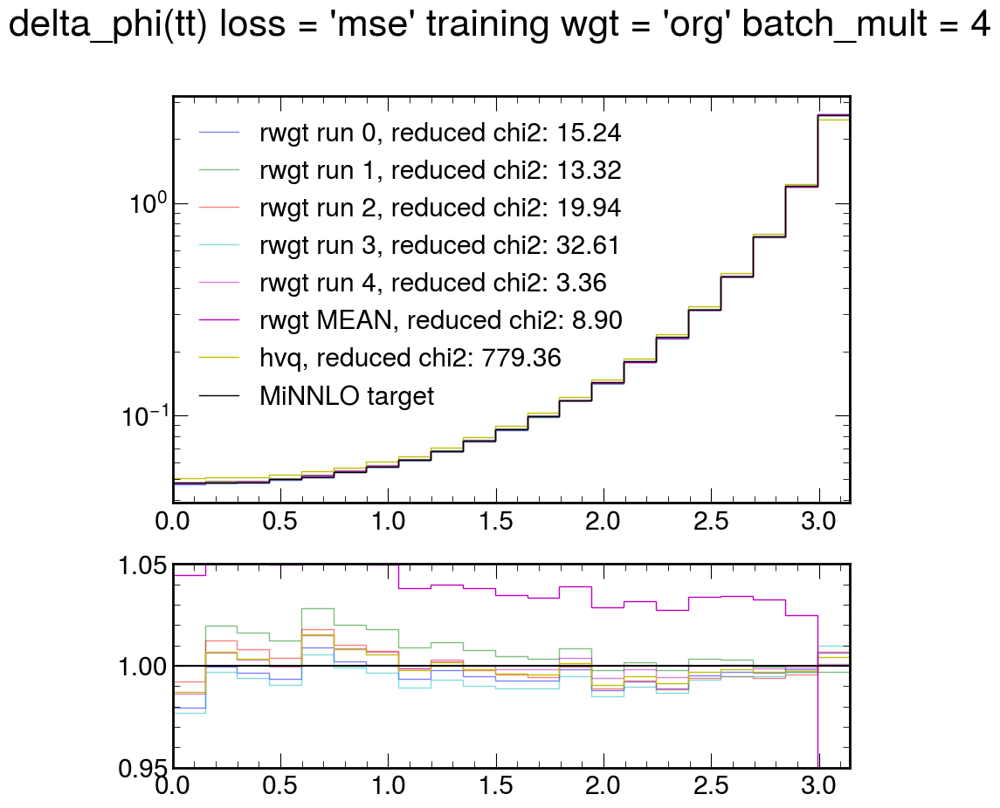

starting with wgt = 'np_mse' batch_mult = 4 and loss = 'mse'
(7, 3, 21)


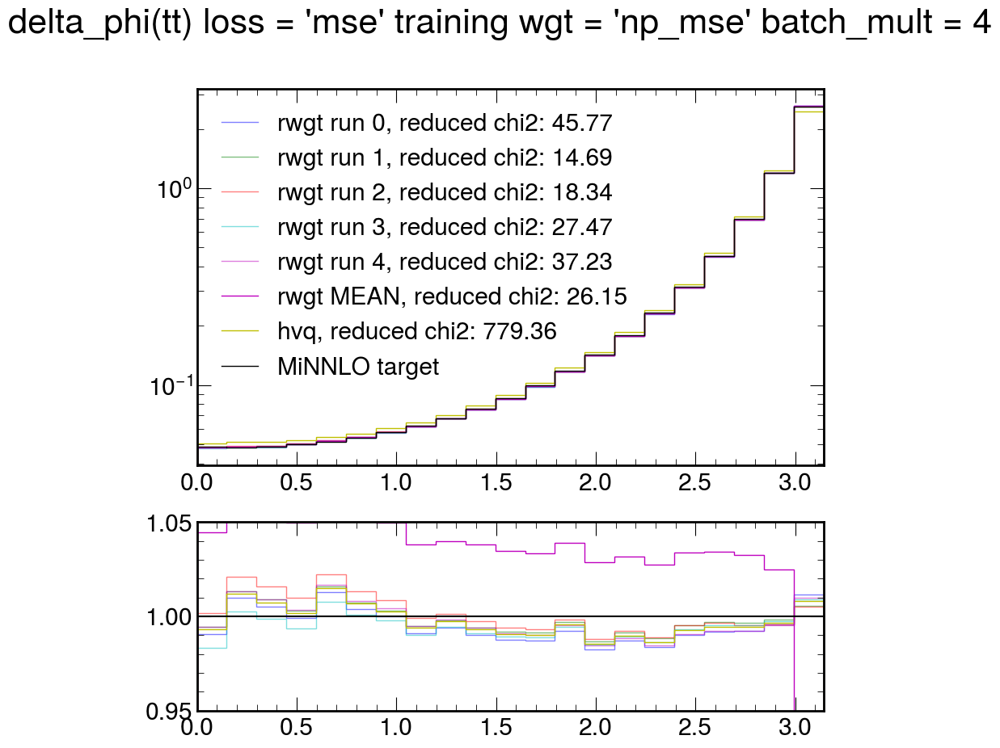

starting with wgt = 'np_cce' batch_mult = 4 and loss = 'mse'
(7, 3, 21)


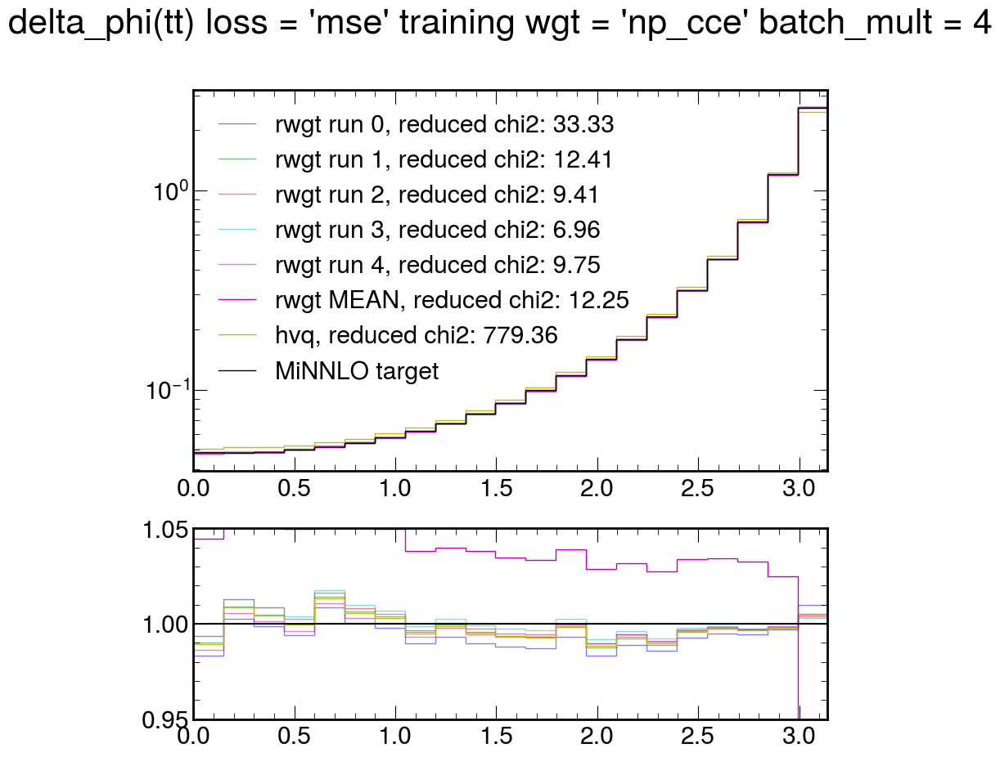

starting with wgt = 'org' batch_mult = 8 and loss = 'mse'
(7, 3, 21)


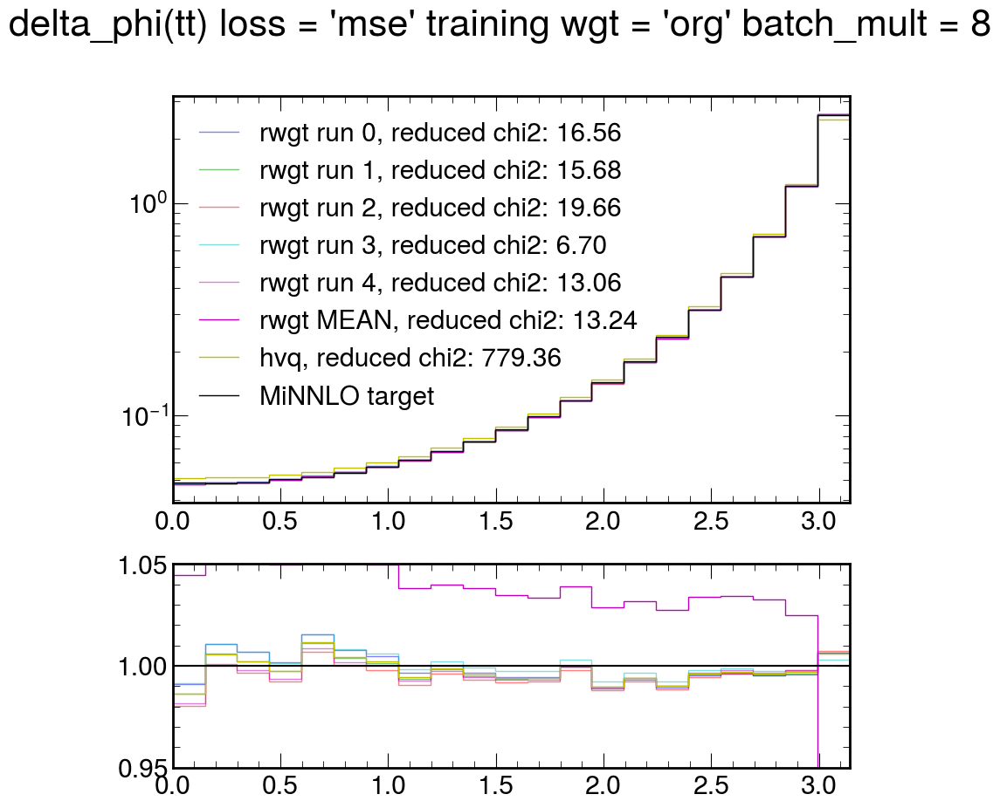

starting with wgt = 'np_mse' batch_mult = 8 and loss = 'mse'
(7, 3, 21)


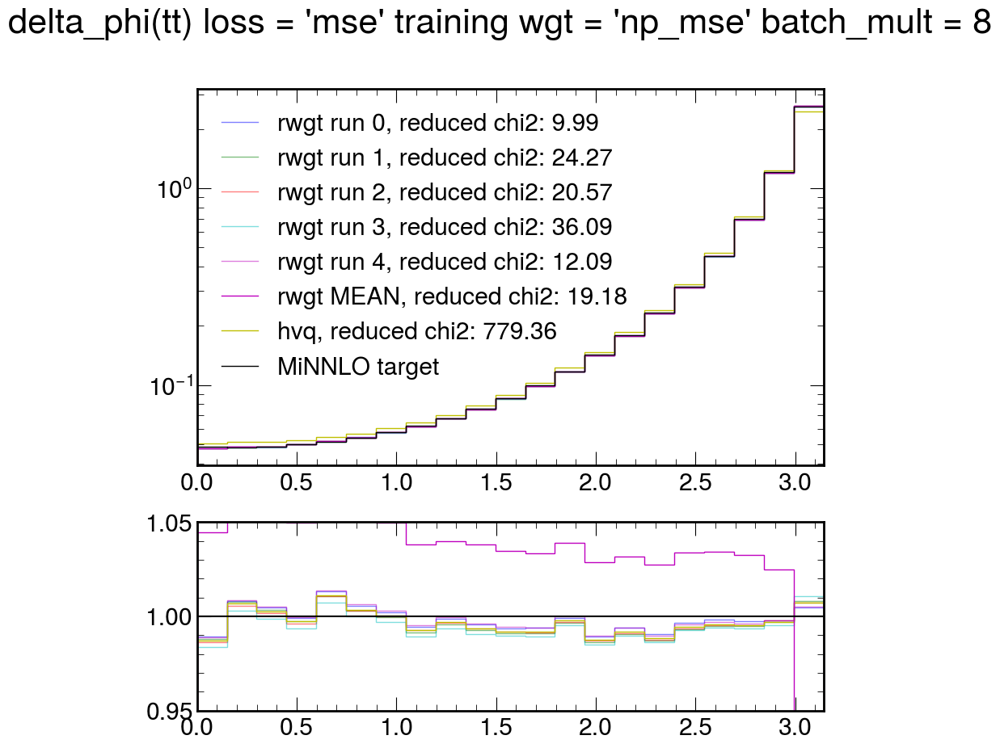

starting with wgt = 'np_cce' batch_mult = 8 and loss = 'mse'
(7, 3, 21)


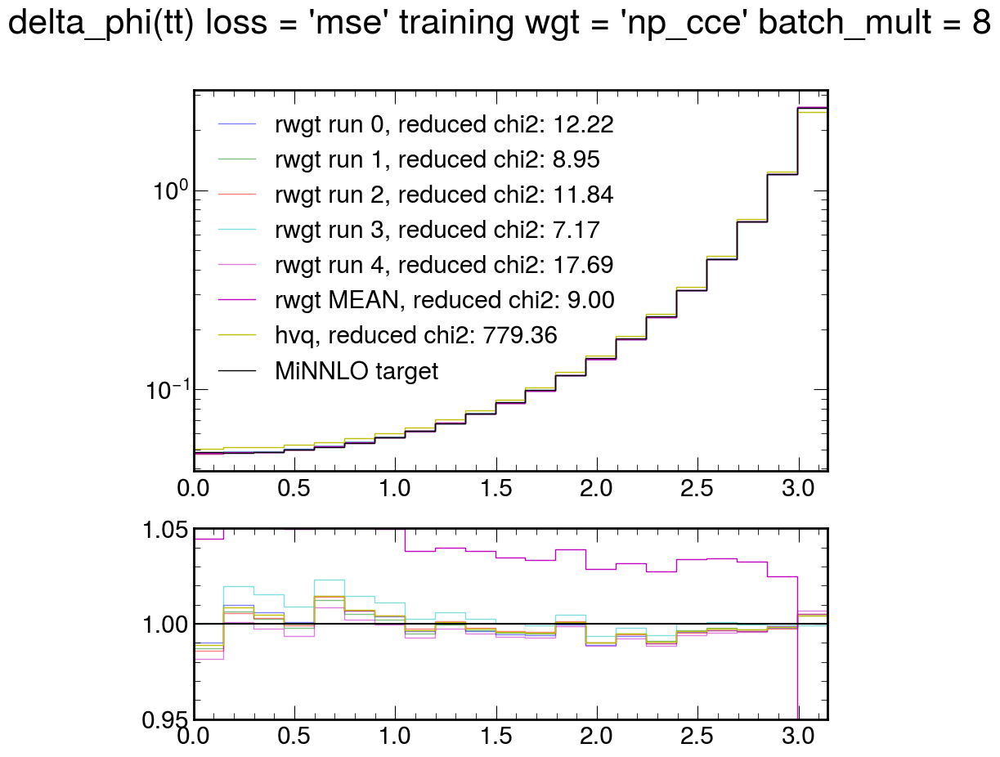

starting with wgt = 'org' batch_mult = 16 and loss = 'mse'
(7, 3, 21)


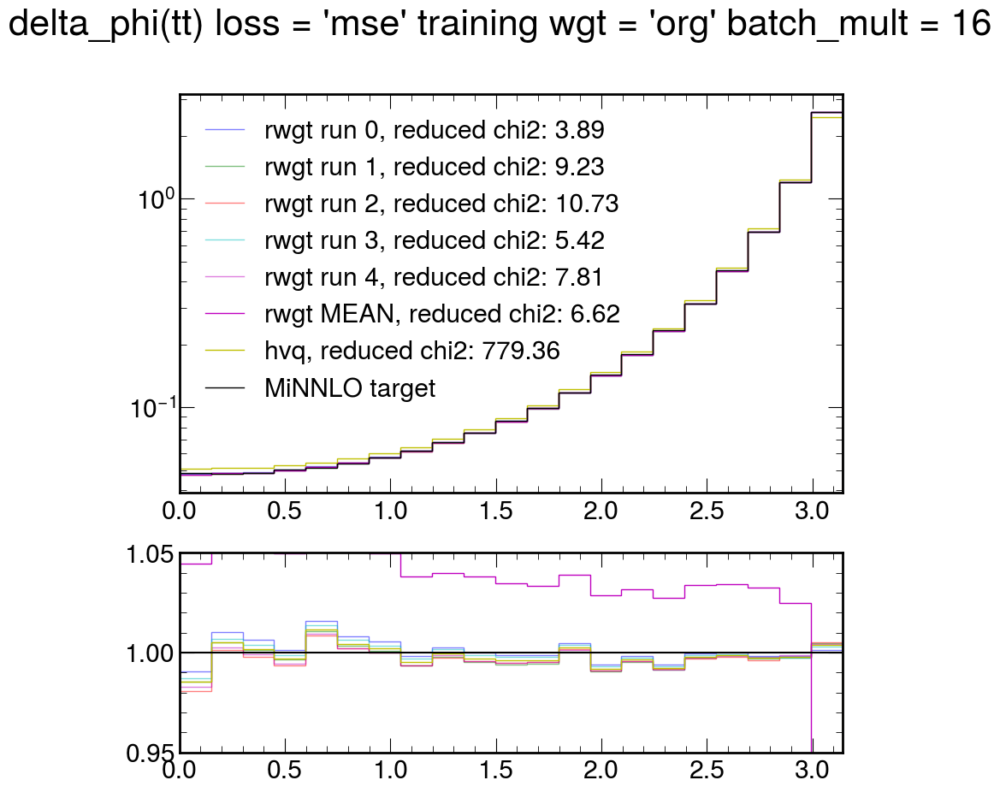

starting with wgt = 'np_mse' batch_mult = 16 and loss = 'mse'
(7, 3, 21)


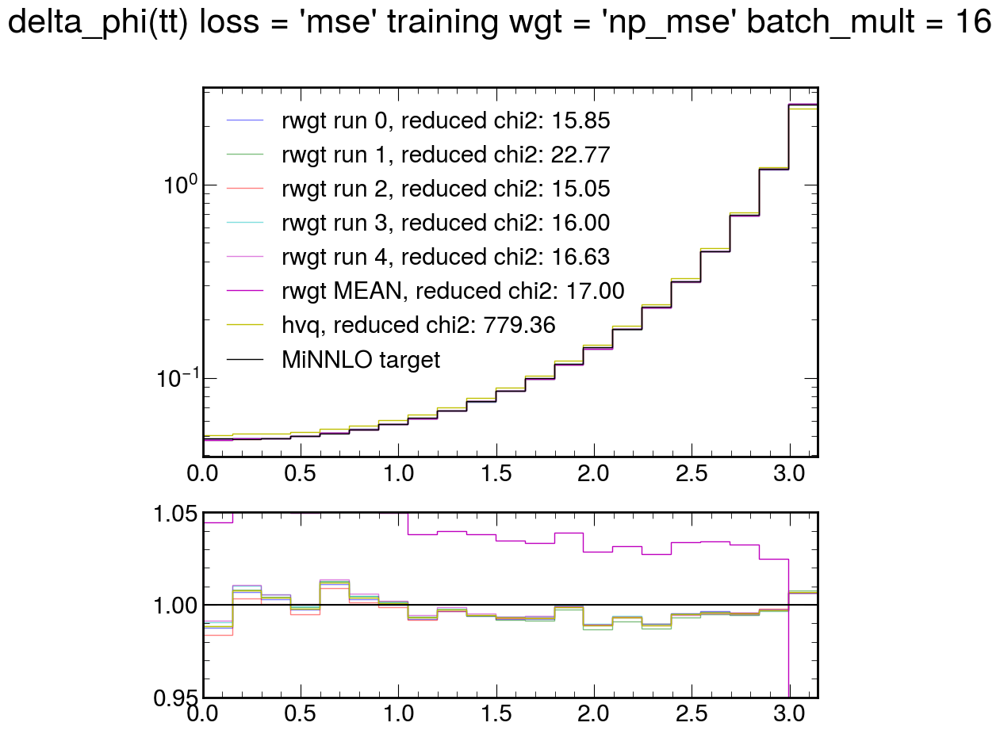

starting with wgt = 'np_cce' batch_mult = 16 and loss = 'mse'
(7, 3, 21)


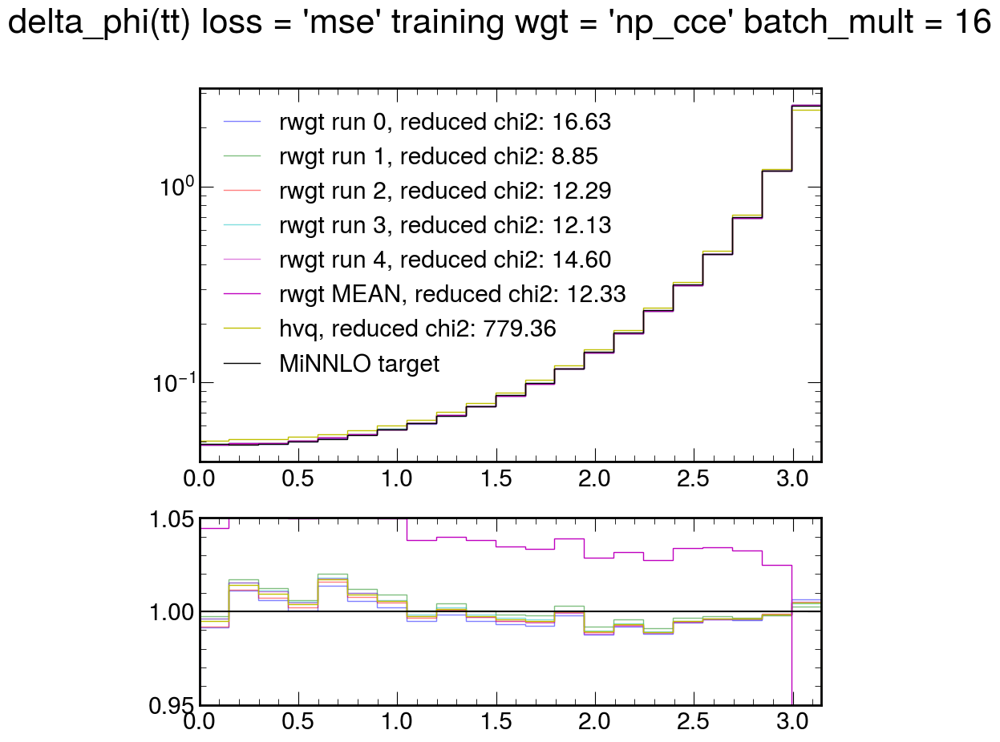

starting with wgt = 'org' batch_mult = 32 and loss = 'mse'
(7, 3, 21)


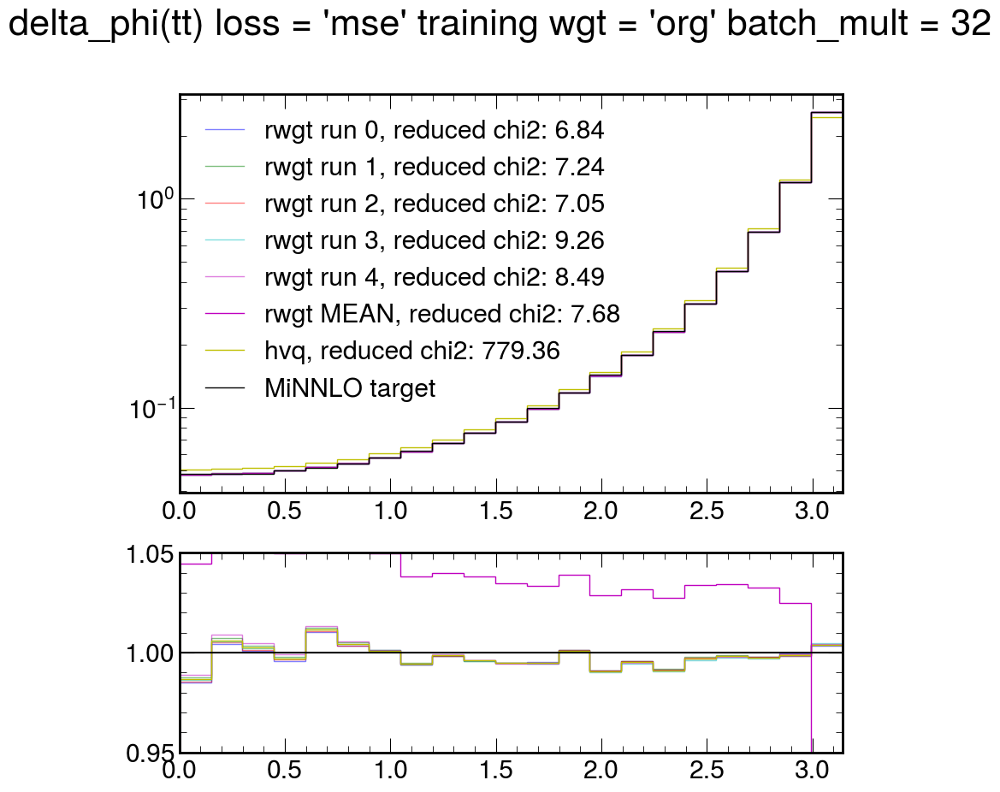

starting with wgt = 'np_mse' batch_mult = 32 and loss = 'mse'
(7, 3, 21)


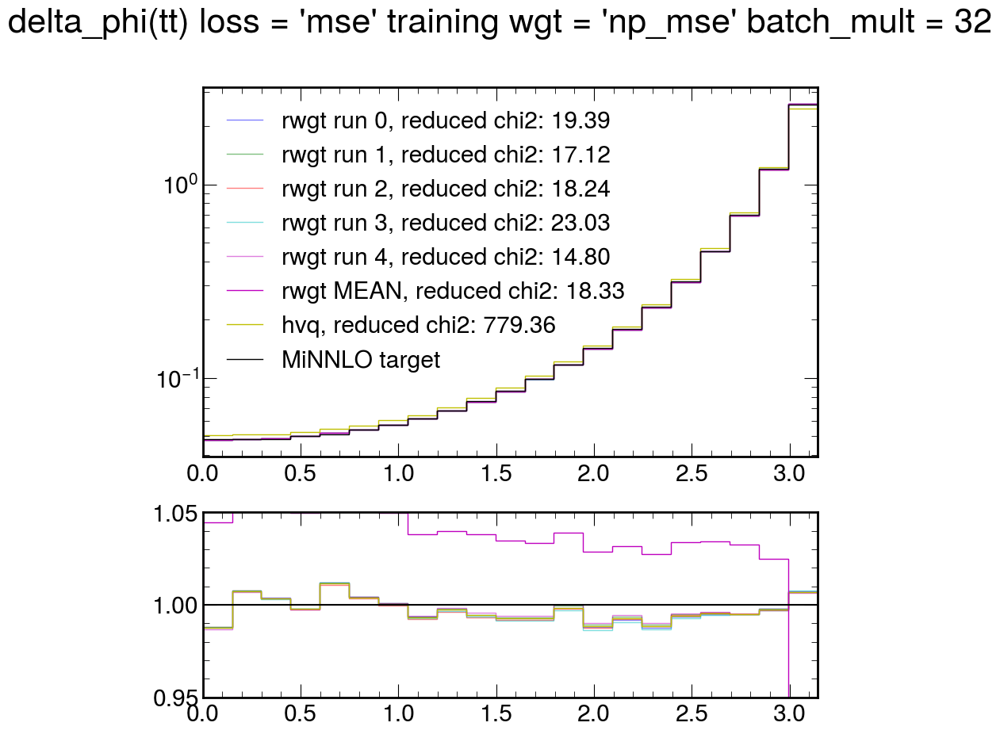

starting with wgt = 'np_cce' batch_mult = 32 and loss = 'mse'
(7, 3, 21)


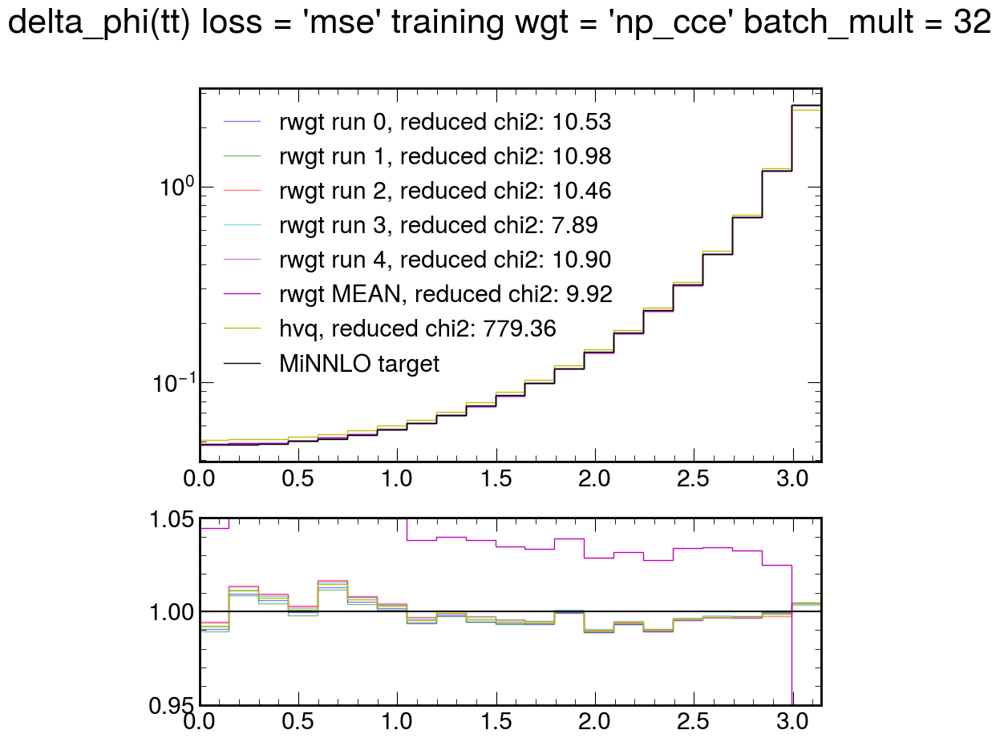

starting with wgt = 'org' batch_mult = 4 and loss = 'cce'
(7, 3, 21)


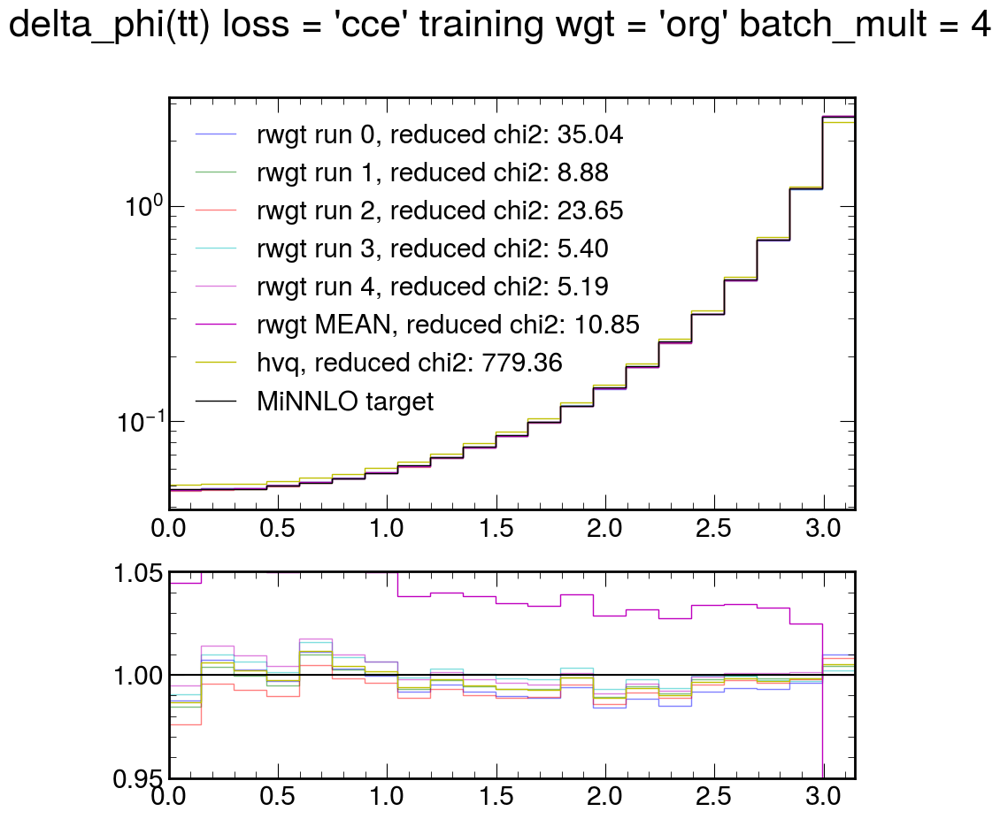

starting with wgt = 'np_mse' batch_mult = 4 and loss = 'cce'
(7, 3, 21)


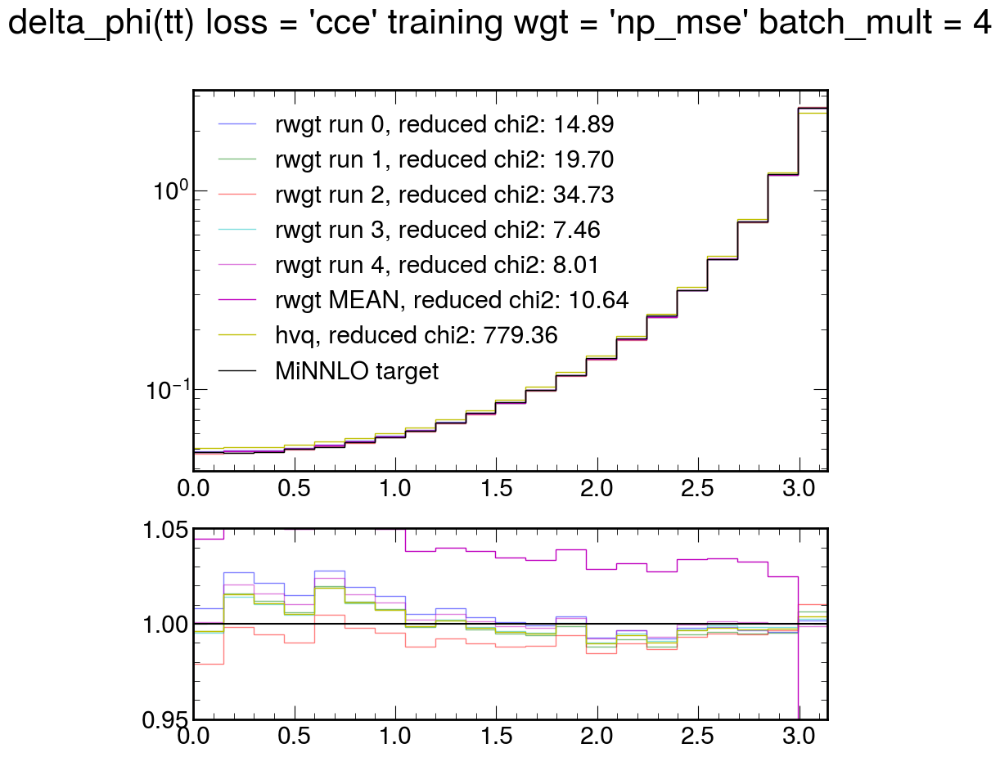

starting with wgt = 'np_cce' batch_mult = 4 and loss = 'cce'
(7, 3, 21)


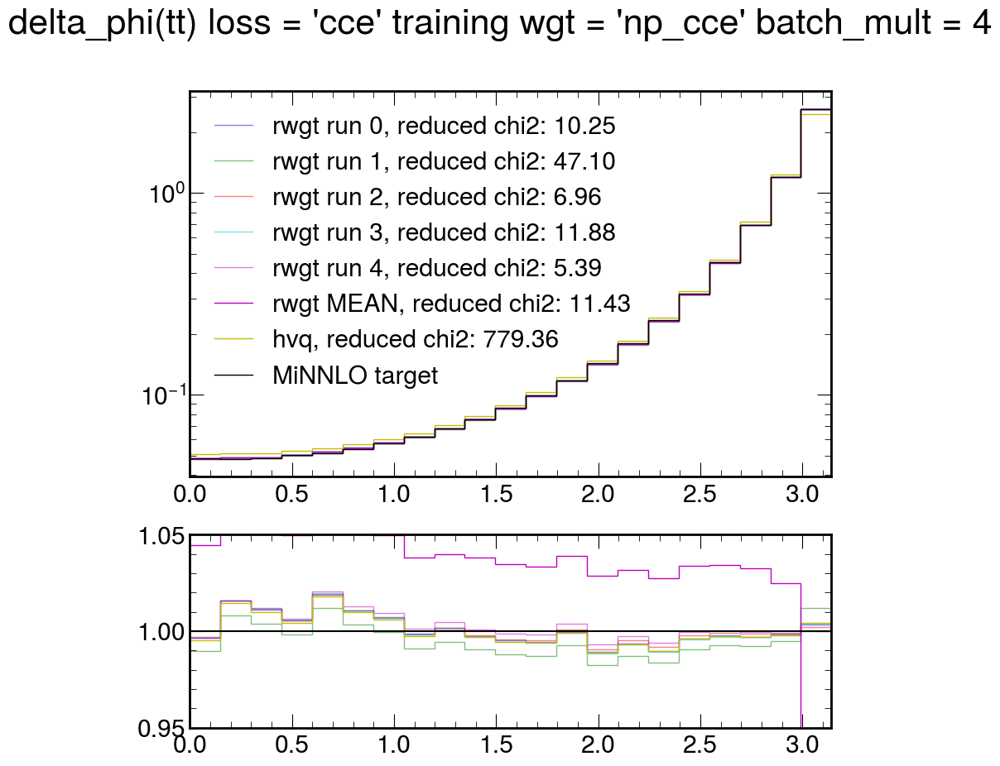

starting with wgt = 'org' batch_mult = 8 and loss = 'cce'
(7, 3, 21)


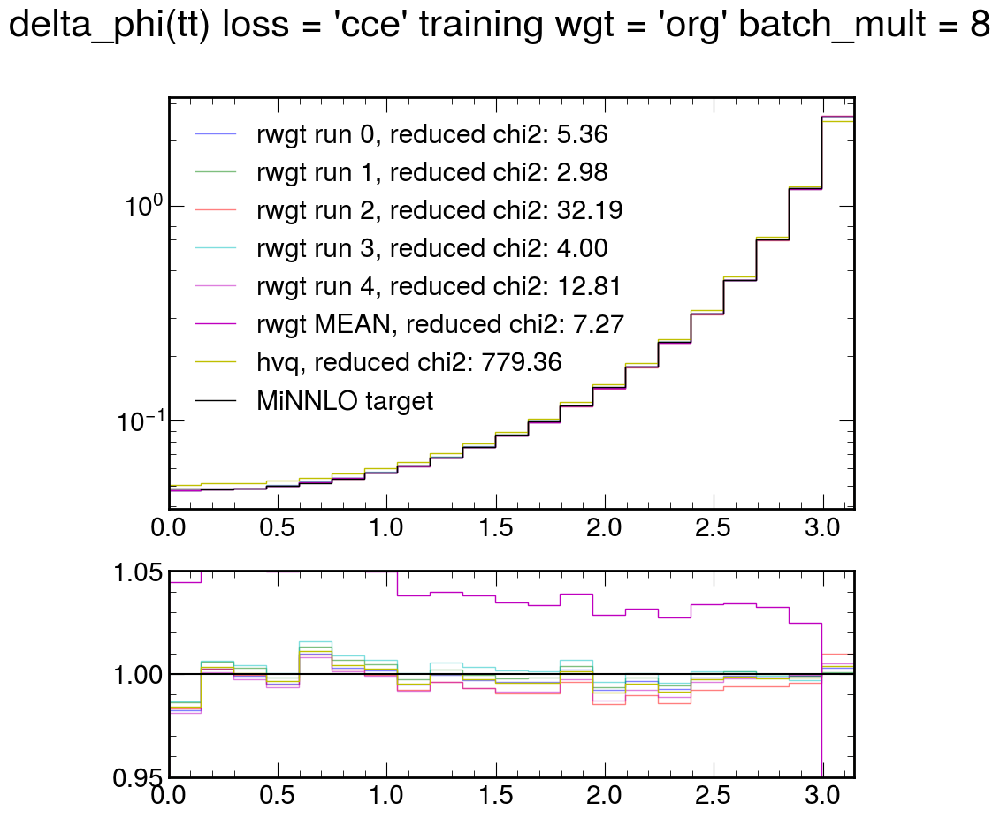

starting with wgt = 'np_mse' batch_mult = 8 and loss = 'cce'
(7, 3, 21)


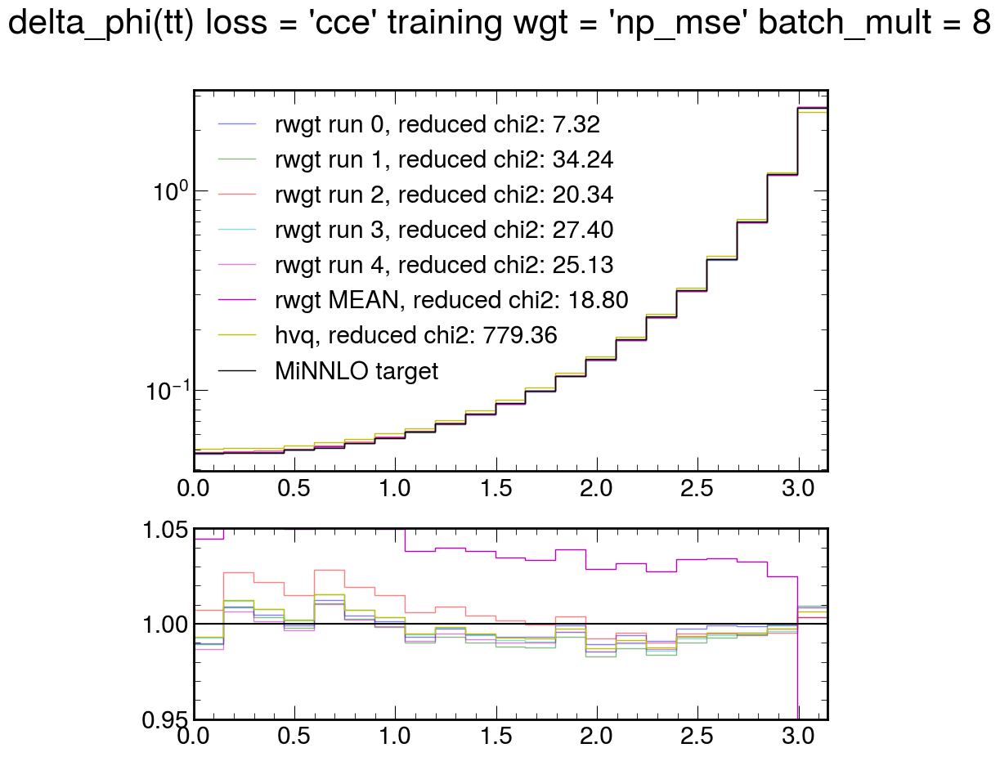

starting with wgt = 'np_cce' batch_mult = 8 and loss = 'cce'
(7, 3, 21)


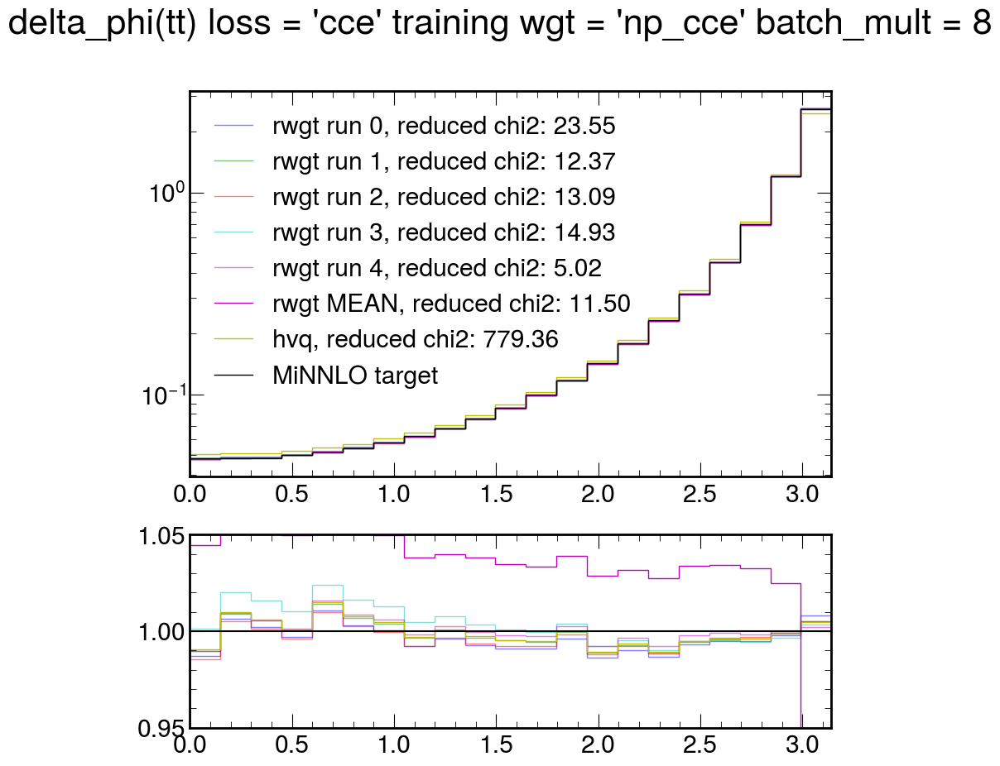

starting with wgt = 'org' batch_mult = 16 and loss = 'cce'
(7, 3, 21)


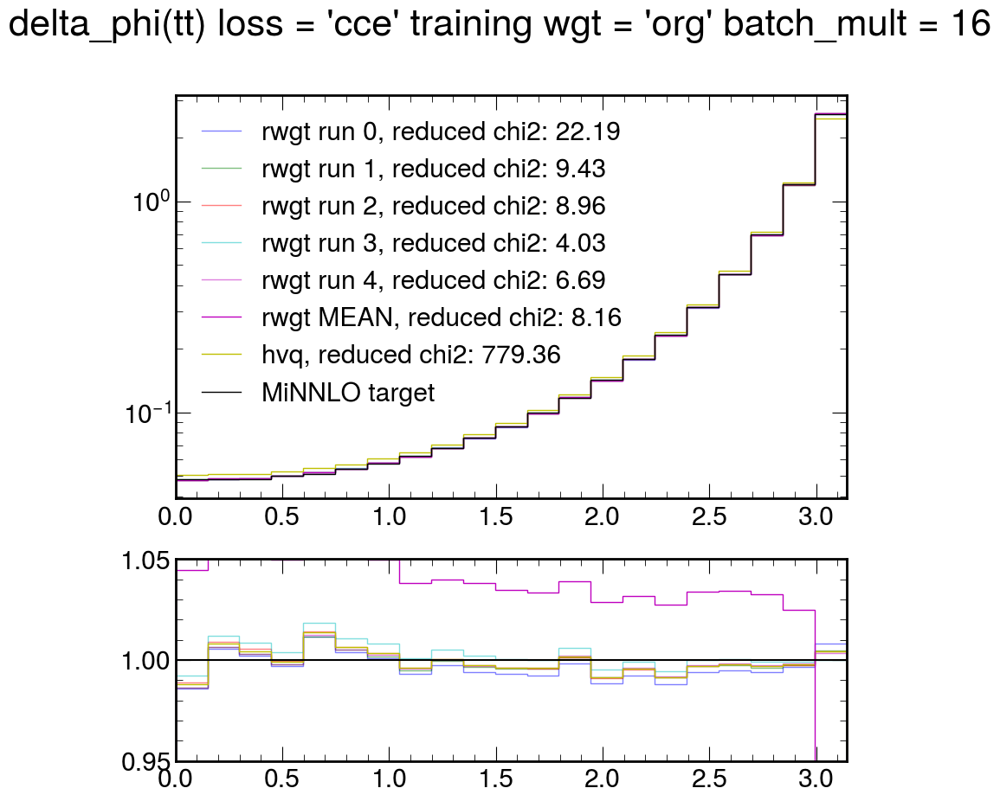

starting with wgt = 'np_mse' batch_mult = 16 and loss = 'cce'
(7, 3, 21)


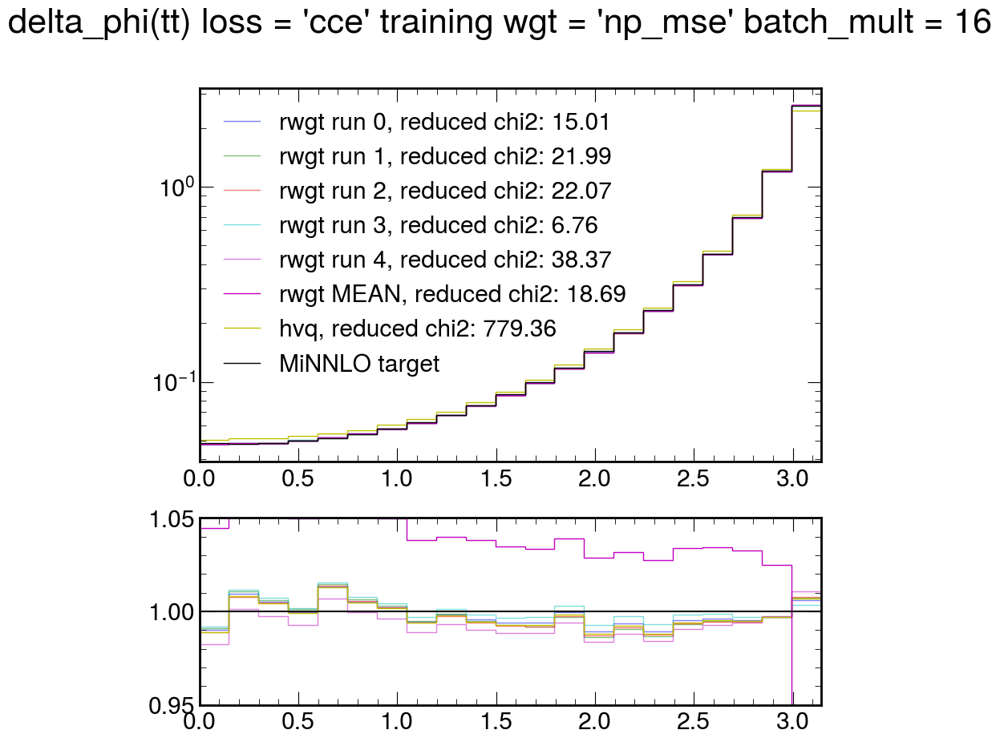

starting with wgt = 'np_cce' batch_mult = 16 and loss = 'cce'
(7, 3, 21)


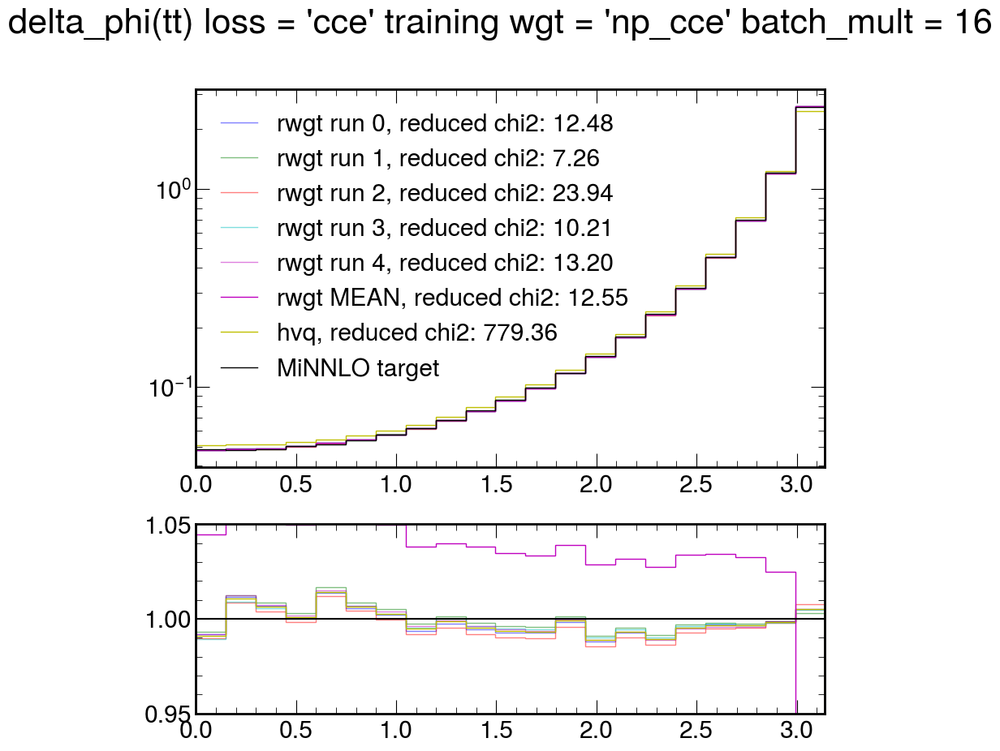

starting with wgt = 'org' batch_mult = 32 and loss = 'cce'
(7, 3, 21)


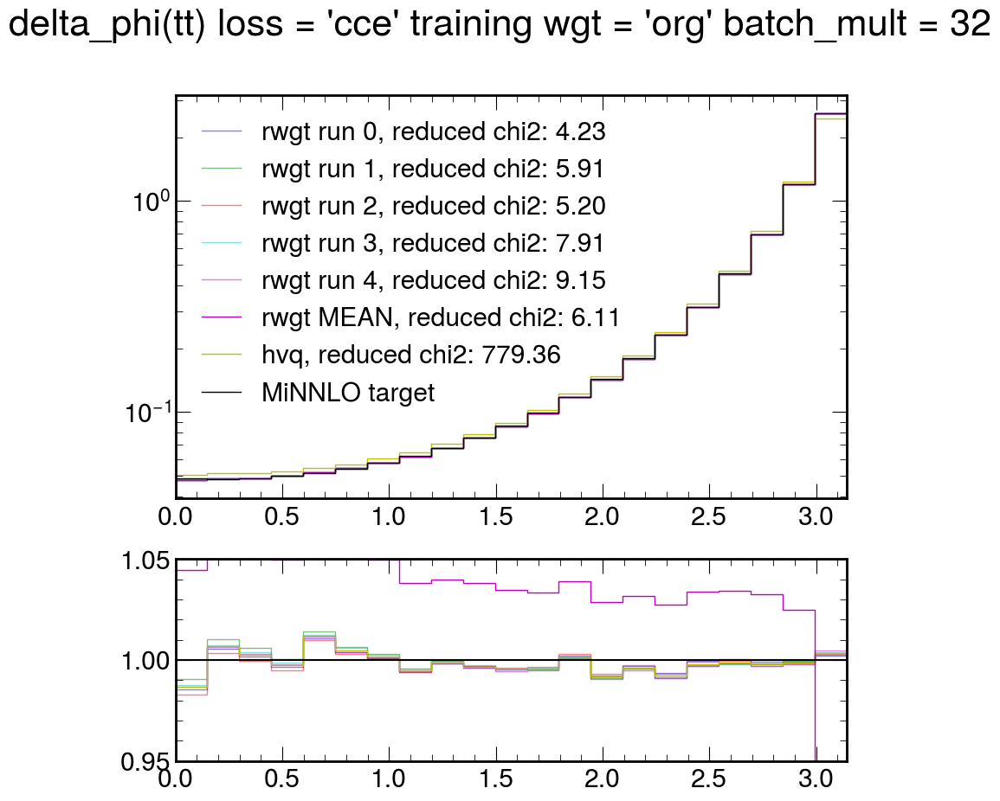

starting with wgt = 'np_mse' batch_mult = 32 and loss = 'cce'
(7, 3, 21)


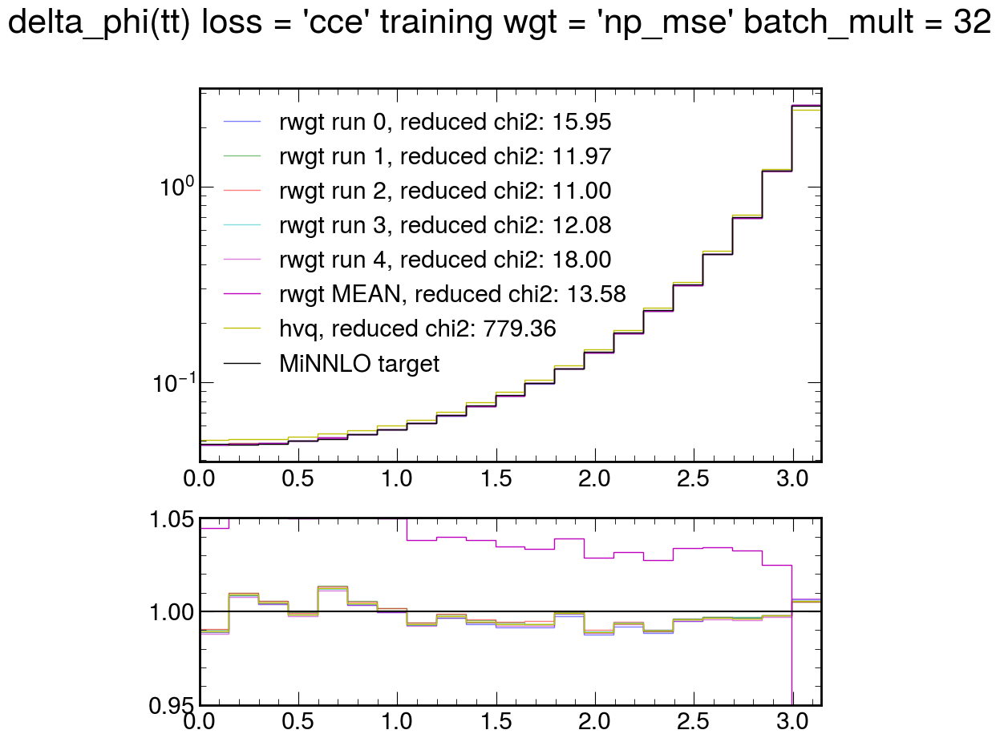

starting with wgt = 'np_cce' batch_mult = 32 and loss = 'cce'
(7, 3, 21)


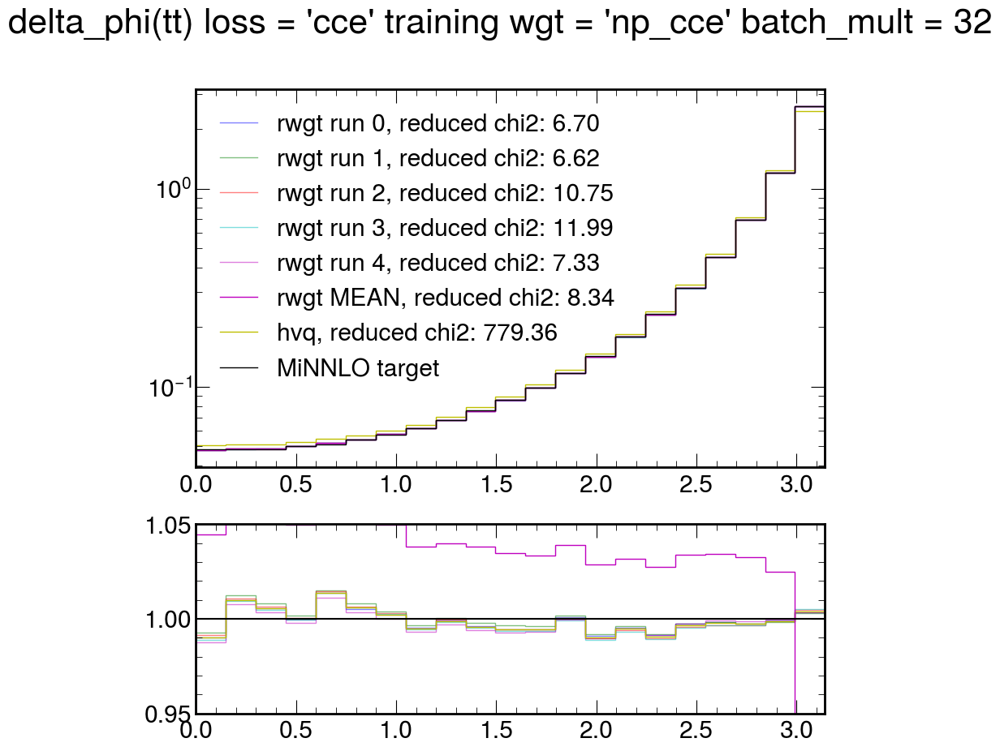

In [65]:
N = len(x1_plt)
ratio_ylim = [0.95, 1.05]

colors = ['b','g','r','c','m','y','k']
start = phi_bins[0]
stop = phi_bins[-1]

for loss in losses:
    for batch_mult in batch_sizes:
        for wgt in wgts:
            print(f'starting with {wgt = } {batch_mult = } and {loss = }')
            
            batch_size = batch_mult*8192
        
            label = f'DCTR_NNLO_wgt_{wgt}_loss_{loss}_batchsize_{batch_size}_hists'
            batch_hists = np.load(f'{save_path}{label}.npy')
            print(batch_hists.shape)
        
            # pt
            fig, ax = plt.subplots(nrows=2,gridspec_kw={'height_ratios': [2, 1]})
            fig.suptitle(f'delta_phi(tt) {loss = } training {wgt = } {batch_mult = }')
            for i in range(0, runs):
                phi_hist = batch_hists[i][2]
                reduced_chi2 = reduced_chi2_test(phi_hist, x1_phi_hist, phi_bins, N)
                ax[0].stairs(phi_hist, phi_bins, label=f'rwgt run {i}, reduced chi2: {reduced_chi2:.2f}', color = colors[i], alpha = 0.5)
        
            phi_hist_mean = batch_hists[-2][2] # last two are mean and std
            # phi_hist_std  = batch_hists[-1][2]
            reduced_chi2 = reduced_chi2_test(phi_hist_mean, x1_phi_hist, phi_bins, N)
            ax[0].stairs(phi_hist_mean, phi_bins, label=f'rwgt MEAN, reduced chi2: {reduced_chi2:.2f}', color=colors[-3])
        
            reduced_chi2 = reduced_chi2_test(x0_phi_hist, x1_phi_hist, phi_bins, N)
            ax[0].stairs(x0_phi_hist, phi_bins, label=f'hvq, reduced chi2: {reduced_chi2:.2f}', color=colors[-2])
            ax[0].stairs(x1_phi_hist, phi_bins, label=f'MiNNLO target', color='black')
            ax[0].set_yscale('log')
            ax[0].legend()
            
            # ratio plot
            for i in range(0, runs):
                phi_hist = batch_hists[i][2]
                ratio = phi_hist/x1_phi_hist
                ax[1].stairs(ratio, phi_bins, label=f'rwgt run {i}, reduced chi2: {reduced_chi2:.2f}', color = colors[i], alpha = 0.5)
                
            ratio_1 = x0_phi_hist/x1_phi_hist
            ratio_2 = phi_hist_mean/x1_phi_hist
            
            ax[1].plot([start, stop], [1,1], '-', color='black', label='MiNNLO target')
            ax[1].stairs(ratio_2, phi_bins, label='mean rwgt', color=colors[-2])
            ax[1].stairs(ratio_1, phi_bins, label='hvq', color=colors[-3])

            ax[1].set_ylim(ratio_ylim)

            ax[0].set_xlim([start,stop])
            ax[1].set_xlim([start,stop])
            
            plt.show()
